<a href="https://colab.research.google.com/github/nahum0804/TallerDeProgramacion-Project/blob/main/Copia_de_Reconocer_rostros_II_Etapa.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Instituto Tecnológico de Costa Rica | TEC
# Carrera de Ingeniería en Computación 
# I Semestre de 2023
# Proyecto Programado (II Fase – Entrevistador asistido por IA) 
# Dr. Abel Méndez Porras
# amendez@itcr.ac.cr
# Porcentaje: 20%

# Entrevistador asistido por IA



El reconocimiento facial y la detección de emociones son tecnologías que se han vuelto cada vez más populares en los últimos años. Estas tecnologías utilizan algoritmos de inteligencia artificial para analizar imágenes y detectar patrones faciales que permiten identificar a las personas y sus emociones.
En cuanto a las oportunidades, el reconocimiento facial puede tener aplicaciones en la seguridad, el marketing y la atención al cliente. Por ejemplo, en la seguridad se pueden utilizar sistemas de reconocimiento facial para identificar a personas en lugares públicos o para controlar el acceso a edificios y sistemas de seguridad. En el marketing, se pueden utilizar para personalizar la publicidad en función de la edad, el género y otros datos demográficos. Y en la atención al cliente, se pueden utilizar para detectar la satisfacción del cliente en tiempo real y responder adecuadamente.

En esta primera etapa del proyecto del curso de Taller de Programación estaremos utilizando los resultados de consultas a modelos de Deep Learning para aplicar los conocimientos adquiridos en clase. 

## Objetivo
Desarrollar una aplicación de complejidad baja que permita poner en práctica los conocimientos adquiridos en los cursos de Introducción a la Programación y Taller de Programación.

## Objetivos Específicos
*  Identificar los requerimientos para resolver un problema específico desde la perspectiva de resolución de problemas, técnicas con listas, diccionarios, clases, objetos y archivos.
*  Diseñar una aplicación para un problema específico desde la perspectiva de resolución de problemas, técnicas con listas, diccionarios, clases, objetos y archivos.
*  Desarrollar una aplicación para un problema específico desde la perspectiva de resolución de problemas, técnicas con listas, diccionarios, clases, objetos y archivos.

## Configuración previa 

### Cargar Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Leer cámara
Tomado de https://colab.research.google.com/drive/1QnC7lV7oVFk5OZCm75fqbLAfD9qBy9bw?usp=sharing#scrollTo=ilLkpcKanPRb



### Importar dependencies

In [2]:
# import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time

### Convertir el objeto JavaScript un objeto OpenCV image

In [3]:
# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert OpenCV Rectangle bounding box image into base64 byte string to be overlayed on video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy array (pixels) containing rectangle to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  bbox_PIL.save(iobuf, format='png')
  # format return string
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes

### Crear nuestro live video stream

In [4]:
# JavaScript to properly create our live video stream using our webcam as input
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;
    
    var pendingResolve = null;
    var shutdown = false;
    
    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }
    
    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }
    
    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);
      
      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);
           
      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);
      
      const instruction = document.createElement('div');
      instruction.innerHTML = 
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };
      
      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);
      
      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();
      
      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }
            
      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }
      
      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;
      
      return {'create': preShow - preCreate, 
              'show': preCapture - preShow, 
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)
  
def video_frame(label, bbox):
  data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
  return data

### Iniciar streaming video

In [5]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image, ImageDraw, ImageFont

In [6]:
import cv2
import numpy as np
import tensorflow as tf
from keras.models import model_from_json

### Cargar modelos de Deep Learning entrenados

*   Para detectar los rostros se utiliza el modelo de Face Haar Cascade.
*   Para detectar las emociones se utiliza el modelo de VGG.
*   También se utiliza un algoritmo adicional para pasar la información del algortimo de VGG a un formato JSON.

Estos modelos y algoritmos están disponibles en el siguiente enlace [Descargar modelos y algoritmos](https://drive.google.com/drive/folders/1KctA_s25bqqMOUlQuy0lwTm0HkBGVycF?usp=sharing). Usted los debe colocar en su Google Drive y modificar la ruta de acceso. 



In [7]:
#Cargar modelos de Deep Learning entrenados
face_haar_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/projectFiles/haarcascade_frontalface_alt.xml') 
model = model_from_json(open("/content/drive/MyDrive/projectFiles/model.json", "r").read()) 
model.load_weights('/content/drive/MyDrive/projectFiles/model.h5') 

Crear interfaz
https://www.youtube.com/watch?v=oIVmV41uyK8

#Perfiles del Entrevistador Personal

El entrevistador personal es una herramienta para recolectar información de personas que están aplicando a un puesto. En la aplicación existen tres perfiles el entrevistador, el entrevistado y el evaluador. La información de estos perfiles debe ser almacenada en clases y usando herencia. Debe existir una clase "padre" que tiene propiedades y métodos que comparten todos los perfiles. Para cada perfil debe existir una clase subordinada que hereda las propiedades de la clase "padre", además, tiene sus propias propiedades y métodos.

In [217]:
#Clase Padre
from datetime import date, datetime

class Person():
    def __init__(self):
        self.id = input("Enter your ID: ")
        self.name = input("Enter your name: ")
        self.gender = input("Gender (Male/Female): ")
        self.birthDay = input("Enter your birthDay (format: DD-MM-YYYY): ")
        self.nacionality = input("Enter your nacionality: ")
        self.address = input("Enter your address: ")

    def calcularEdad(self):
      today = date.today()
      fecha_nacimiento_str = self.birthDay
      fecha_nacimiento = datetime.strptime(fecha_nacimiento_str, "%d-%m-%Y").date()
      edad = today.year - fecha_nacimiento.year - ((today.month, today.day) < (fecha_nacimiento.month, fecha_nacimiento.day))
      return edad


## Recolectar información del entrevistador


El entrevistador es la persona encargada de realizar las entrevistas. 

Información requerida del entrevistador (Toda la información requerida debe ser almacenada en la clase Entrevistador. Cada vez que se registra un entrevistador se debe crear una instancia de la clase Entrevistador para guardar toda la información del entrevistador). 
*   Identificación  
*   Nombre 
*   Fecha de nacimiento
*   Nacionalidad
*   Números de teléfono y celular (un diccionario)
*   Emails (una lista con uno o varios emails)
*   Dirección

Usted debe incluir al menos tres propiedades únicas al entrevistador.
Cada vez que se crea una instancia de Entrevistador, la instancia debe ser almacenada en un archivo binario llamado Archivo_Entrevistador.

In [218]:
class Interviewer(Person):
    def __init__(self):
        super().__init__()
        self.trained = True                                           # 1 - New Attribute
        self.ocupattion = input("Ocupation / Job: ")                  # 2 - New Attribute
        self.yearsOfExperience = int(input("Years of experience: "))  # 3 - New Attribute
        self.cellphones = dict()
        i = 1
        while True:
          cellphone = input("Cellphone: ")
          self.cellphones[f"Cellphone-{i}"] = cellphone
          i += 1
          option = input("You want add another cellphone number? Y/N: ")
          if option == "Y":
            continue
          elif option == "N":
            break
          else:
            print("Invalid option - (You most enter the options in capital letters!)")
            break
        self.emails = []
        while True:
          email = input("Email: ")
          self.emails["email"].append(email)
          option = input("You want add another email? Y/N: ")
          if option == "Y":
            continue
          elif option == "N":
            break
          else:
            print("Invalid option - (You most enter the options in capital letters!)")
            break


## Recolectar información del evaluador

El evaluador en la persona encargada de revisar la información obtenida de cada entrevista. 

Información requerida del evaluador (Toda la información requerida debe ser almacenada en la clase Evaluador. Cada vez que se registra un evaluador se debe crear una instancia de la clase Evaluador para guardar toda la información del evaluador). 
*   Identificación  
*   Nombre 
*   Fecha de nacimiento
*   Nacionalidad
*   Números de teléfono y celular (un diccionario)
*   Emails (una lista con uno o varios emails)
*   Dirección

Usted debe incluir al menos tres propiedades únicas al evaluador.
Cada vez que se crea una instancia de Evaluador, la instancia debe ser almacenada en un archivo binario llamado Archivo_Evaluador.

In [219]:
class Evaluator(Person):
    def __init__(self):
        super().__init__()
        self.career = input("Enter the name of your university career: ")  # 1 - New Attribute
        self.salary = input("Enter your salary: ")                         # 2 - New Attribute
        print("Levels: \n * Hard \n * Intermediate \n * Soft")
        self.level = input("Choose the level of the evaluator")            # 3 - New Attribute
        self.cellphones = dict()
        i = 1
        while True:
          cellphone = input("Cellphone: ")
          self.cellphones[f"Cellphone-{i}"] = cellphone
          i += 1
          option = input("You want add another cellphone number? Y/N: ")
          if option == "Y":
            continue
          elif option == "N":
            break
          else:
            print("Invalid option - (You most enter the options in capital letters!)")
            break
        self.emails = []
        while True:
          email = input("Email: ")
          self.emails["email"].append(email)
          option = input("You want add another email? Y/N: ")
          if option == "Y":
            continue
          elif option == "N":
            break
          else:
            print("Invalid option - (You most enter the options in capital letters!)")
            break

## Recolectar información del entrevistado

El entrevistado es la persona que está interesada en el puesto de trabajo.

Información requerida al entrevistar una persona (Toda la información requerida debe ser almacenada en la clase Entrevistado. Cada vez que se registra un entrevistado se debe crear una instancia de la clase Entrevistado para guardar toda la información del entrevistado).
*   Identificación  
*   Nombre 
*   Fecha de nacimiento
*   Nacionalidad
*   Números de teléfono y celular (un diccionario)
*   Emails (una lista con uno o varios emails)
*   Dirección
*   Estado civil
*   Cantidad de hijos indicando el género, la fecha de nacimiento(un diccionario) 
*   Entrevistas (cada persona puede ser entrevistada cero o más veces). Las entrevistas se realizan en tiempo real utilizando una camára integrada a la computadora o externa (el profesor facilita el código para activar la camára, capturar el video y capturar los frames cada cierto tiempo). Se debe crear una lista con sublistas donde cada sublista tiene las imagenes capturas y las emociones reportadas durante la entrevista. Además, debe guardar coordenadas donde se encuentra el rostro en la imagen. Para cada entrevista, el entrevistado debe contar historias cortas sobre los siguientes 4 tópicos:


  >*   Una experiencia de sorpresa o asombro que ha tenido que vivir.
  >*   Una experiencia de tristeza que ha tenido que vivir.
  >*   Una experiencia de enojo o frustración que ha tenido que vivir.
  >*   Una experiencia de felicidad que ha tenido que vivir.

Un aspecto importante es que cada vez que se va a realizar una entrevista se debe indicar quién es el entrevistador.

Usted debe incluir al menos tres propiedades únicas al perfil de entrevistado. Cada vez que se crea una instancia de Entrevistado, la instancia debe ser almacenada en un archivo binario llamado Archivo_Entrevistado.

In [265]:
class Interviewed(Person):
    def __init__(self):
        super().__init__()
        self.technicalSkills = []                          # 1 - New Attribute
        self.softSkills = []                               # 2 - New Attribute
        self.lenguageNative = input("Native Lenguage: ")   # 3 - New Attribute
        self.accepted = False
        self.civilStatus = input("Enter your civil status: ")
        self.cellphones = dict()
        i = 1
        while True:
          cellphone = input("Cellphone: ")
          self.cellphones[f"Cellphone-{i}"] = cellphone
          i += 1
          option = input("You want add another cellphone number? Y/N: ")
          if option == "Y":
            continue
          elif option == "N":
            break
          else:
            print("Invalid option - (You most enter the options in capital letters!)")
            break
        self.emails = []
        while True:
          email = input("Email: ")
          self.emails.append(email)
          option = input("You want add another email? Y/N: ")
          if option == "Y":
            continue
          elif option == "N":
            break
          else:
            print("Invalid option - (You most enter the options in capital letters!)")
            break
        self.photoData = []
        self.childrenData = {}
        children = input("Do you have children? Y/N: ")
        if children == "Y":
            valid = True
            while valid:
                nameChild = input("Name: ")
                gender = input("Gender (Male/Female): ")
                birthDay = input("BirthDay (format: DD-MM-YYYY): ")

                self.childrenData[nameChild] = dict()
                self.childrenData[nameChild]["gender"] = gender
                self.childrenData[nameChild]["birthDay"] = birthDay

                option = input("You want add another child? Y/N: ")
                if option == "Y":
                    continue
                elif option == "N":
                    valid = False
                else:
                    print("Invalid option - (You most enter the options in capital letters!)")
                    valid = False
        elif children == "N":
            pass
        else:
            print("Invalit option")

In [266]:
import pickle

def addNewInterviewed():
  newInterviewed = Interviewed()

  with open("/content/drive/MyDrive/projectFiles/personsCapturedData/Archivo_Entrevistado.bin", "ab") as f:
    pickle.dump(newInterviewed, f)

In [352]:
#Compiling information
#Start form

addNewInterviewed()

Enter your ID: 34
Enter your name: Javier
Gender (Male/Female): Male
Enter your birthDay (format: DD-MM-YYYY): 12-05-1995
Enter your nacionality: CR
Enter your address: Ciudad Quesada
Native Lenguage: Spanish
Enter your civil status: Single
Cellphone: 45343534
You want add another cellphone number? Y/N: N
Email: fsd@gmail.com
You want add another email? Y/N: N
Do you have children? Y/N: Y
Name: Pedro
Gender (Male/Female): Male
BirthDay (format: DD-MM-YYYY): 10-05-2009
You want add another child? Y/N: N


### Recolectar información emociones
Este código se encarga de ejecutar la captura de video de la cámara, detectar los rostros en las imágenes y reconocer las emociones presentes en los rostros. Cuando se hace la entrevista es en este código donde usted de obtener la información para crear las listas con la información solicitada.

In [281]:
def chooseNameObject(name):
    userName = ""
    f = open("/content/drive/MyDrive/projectFiles/personsCapturedData/Archivo_Entrevistado.bin", "rb")
    f.seek(0)
    flag = 0
    while flag ==0:
        try:
            e = pickle.load(f)
            if e.name == name:
              return e
        except:
            flag = 1
    f.close


<IPython.core.display.Javascript object>

Ingrese su name antes de comenzar la entrevista: Adrian
A evaluar  Adrian
1/1 [==============================] - 0s 45ms/step
Datos recopilados


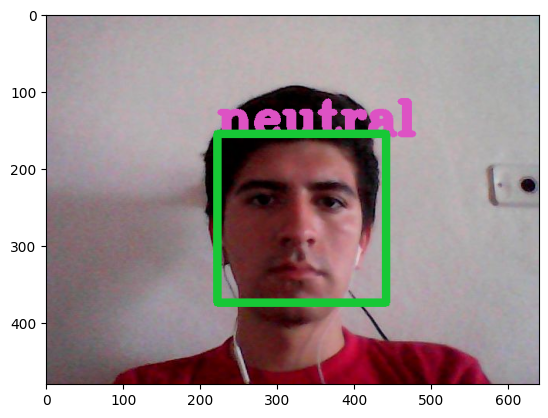

1/1 [==============================] - 0s 44ms/step
Datos recopilados


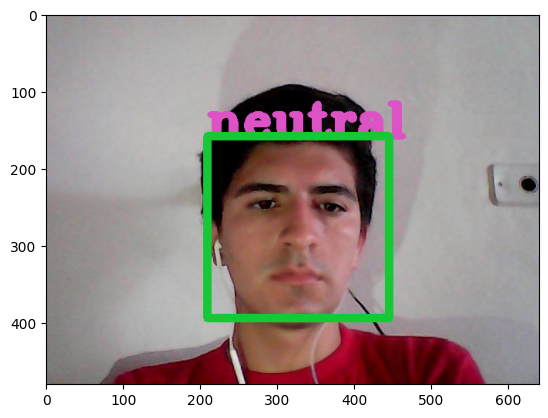

1/1 [==============================] - 0s 61ms/step
Datos recopilados


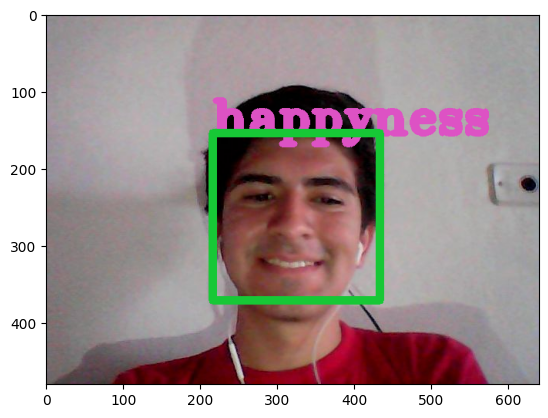

1/1 [==============================] - 0s 42ms/step
Datos recopilados


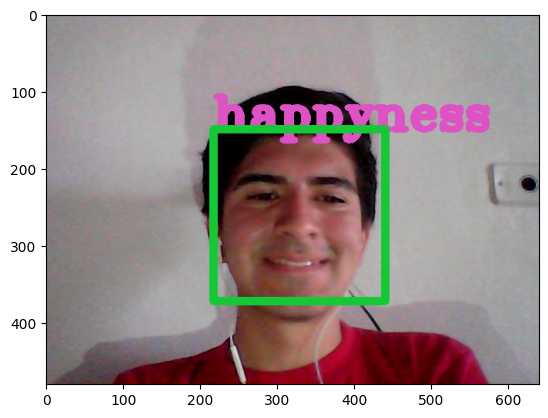

1/1 [==============================] - 0s 42ms/step
Datos recopilados


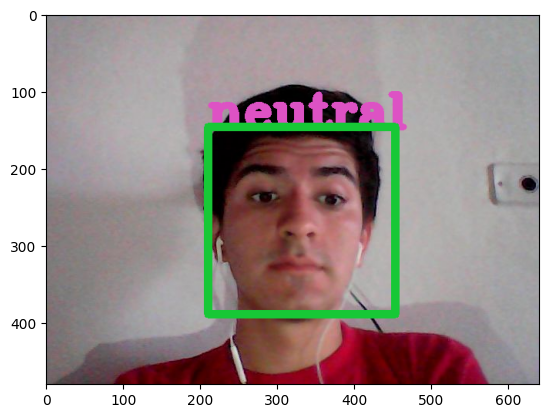

In [379]:
from tensorflow.python.ops.math_ops import sign
import time
# start streaming video from webcam
video_stream()
# label for video
label_html = 'Capturing...'
# initialze bounding box to empty
bbox = ''
count = 0 
j = 5

nameInput = input("Ingrese su name antes de comenzar la entrevista: ")
objectRname = chooseNameObject(nameInput)
print("A evaluar ",objectRname.name)

while True:
  js_reply = video_frame(label_html, bbox)
  if not js_reply:
    break

  # convert JS response to OpenCV Image
  img = js_to_image(js_reply["img"])
  img_copy = img

  # create transparent overlay for bounding box
  bbox_array = np.zeros([480,640,4], dtype=np.uint8)


  if count == j: #El tiempo para capturar el frame y procesarlo
    #Identify unrepeatable photo
    var = time.time()
    #Este sería el path de la imagen guardada
    image_path ='/content/drive/MyDrive/projectFiles/imagesGained-IIS/' + objectRname.name + str(var) +  '.jpg'
    #se guarda el fotograma con el "nombre" más el número del contador i  
    cv2.imwrite(image_path , img) 
    
    #Detectar los rostros usando Face Haar Cascade
    gray_image = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #En faces_deteted se encuentran los rotros detectados
    faces_detected = face_haar_cascade.detectMultiScale(gray_image,1.32,5)
    #Imprimir ubicación de los rostros en la imagen
    #print("Ubicación del rostro:", faces_detected)
    im2Display = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    imTemp = im2Display.copy()

    #Hacer un rectángulo en cada rostro detectado en la imagen
    for (x,y,w,h) in faces_detected:
        cv2.rectangle(img,(x,y), (x+w,y+h), (255,0,0), thickness=7)

        roi_gray=gray_image[y:y+w,x:x+h]
        roi_gray=cv2.resize(roi_gray,(48,48))

        #Processes the image and adjust it to pass it to the model
        image_pixels = tf.keras.preprocessing.image.img_to_array(roi_gray)
       
        image_pixels = np.expand_dims(image_pixels, axis = 0)
        image_pixels /= 255

        #Obtener las emociones para cada rostro detectado en la imagen
        #Get the prediction of the model
        predictions = model.predict(image_pixels)
        #Mostrar todas las emociones detectadas
        #print("Predicciones: ", predictions)
        #Mostrar la emoción más significativa (con el valor más alto)
        max_index = np.argmax(predictions[0])
        #print(max_index, predictions[0])
        #El orden en que vienen las emociones
        emotion_detection = ('angry', 'disgust', 'fear', 'happyness', 'sadness', 'surprise', 'neutral')

        emotion_prediction = emotion_detection[max_index]
        #Crear un diccionario para almacenar la emoción y el valor para la emoción
        frame_dic = dict(
            angry = predictions[0][0],
            disgust = predictions[0][1],
            fear = predictions[0][2],            
            happiness = predictions[0][3],
            sadness = predictions[0][4],
            surprise = predictions[0][5],
            neutral = predictions[0][6]) 
        #print("Predicciones: ", frame_dic)
        #print( emotion_prediction )
        
        #Mostrar en la imagen un texto de la emoción más significativa
        ubicacion = (x,y)
        font = cv2.FONT_HERSHEY_TRIPLEX
        tamañoLetra = 2
        colorLetra = (221,82,196)
        grosorLetra = 7
        #Escribir texto con la emoción más significativa
        cv2.putText(imTemp, emotion_prediction, ubicacion, font, tamañoLetra, colorLetra, grosorLetra)
        pt1 = (x, y)
        pt2 = (x+w, y+h)
        color = (23,200,54)
        thickness = 10
        cv2.rectangle(imTemp, pt1, pt2, color, thickness)


       #-------Adding captured data----------------

        if objectRname.name == nameInput:

          imagesData = dict()

          imagesData = dict()
          imagesData["image_path"] = image_path
          imagesData["emotions"] = frame_dic
          imagesData["Location"] = faces_detected

          listaX = []
          listaX.append(imagesData) #Sublista para agregar los elementos a la lista padre

          objectRname.photoData.append(listaX)
          print("Datos recopilados")
        else:
          print("Este usuario no existe dentro de la base de datos")

        #-------Adding captured data----------------

    #Mostrar la imagen con los cuadros en los rostros y el texto de la emoción más significativa
    plt.imshow(imTemp)
    plt.show()

    j +=5
  count +=1

In [360]:
print(objectRname.photoData)

[[{'image_path': '/content/drive/MyDrive/projectFiles/imagesGained-IIS/Nahum1684098486.393894.jpg', 'emotions': {'angry': 0.06896821, 'disgust': 0.0007586266, 'fear': 0.087094426, 'happiness': 0.021584926, 'sadness': 0.19230866, 'surprise': 0.010090621, 'neutral': 0.61919457}, 'Location': array([[197, 117, 227, 227]], dtype=int32)}], [{'image_path': '/content/drive/MyDrive/projectFiles/imagesGained-IIS/Nahum1684098490.387383.jpg', 'emotions': {'angry': 0.00068817026, 'disgust': 1.1175464e-05, 'fear': 0.00092896476, 'happiness': 0.9787773, 'sadness': 0.0022308775, 'surprise': 0.000594758, 'neutral': 0.01676877}, 'Location': array([[198, 114, 237, 237]], dtype=int32)}], [{'image_path': '/content/drive/MyDrive/projectFiles/imagesGained-IIS/Nahum1684098494.2004066.jpg', 'emotions': {'angry': 0.0649208, 'disgust': 0.0056539574, 'fear': 0.3301266, 'happiness': 0.022322236, 'sadness': 0.14843601, 'surprise': 0.26306885, 'neutral': 0.16547155}, 'Location': array([[191, 113, 265, 265]], dtype=i

In [361]:
def loadIntervieweds():
    lista = []
    f = open("/content/drive/MyDrive/projectFiles/personsCapturedData/Archivo_Entrevistado.bin", "rb")
    f.seek(0)
    flag = 0
    while flag ==0:
        try:
            e = pickle.load(f)
            lista.append(e)
        except:
            flag = 1
    f.close
    return lista  

def updateData(objtectToRefresh):
  lista = loadIntervieweds()
  x = 0
  for i in lista:
    print(i)
    if i.id == objtectToRefresh.id:
      lista[x] = objtectToRefresh
    x += 1
  return lista

def saveInFileData(objtectToRefresh):
    lista = updateData(objtectToRefresh)
    with open('/content/drive/MyDrive/projectFiles/userData.bin', 'wb'):
        pass  # limpia el archivo
    with open("/content/drive/MyDrive/projectFiles/personsCapturedData/Archivo_Entrevistado.bin", "wb") as f:
        f.truncate()  # limpia el archivo
        for i in lista:
            pickle.dump(i, f)

In [380]:
saveInFileData(objectRname)

In [363]:
loadIntervieweds()

**1)**

DATA:
Name: Nahum
ID: 12
BirthDay entered: 30-08-2004
Age (In years old): 18
Nacionality: CR
Cellphone: 
 Cellphone-1: Cellphone-1 
Emails:
 n4hummuro227@gmail.com
 namurillo@estudiantec.cr
Location: ['n4hummuro227@gmail.com', 'namurillo@estudiantec.cr']
Civil Status: Single
Dont have children
Images Captured: ------------------------------------------------------


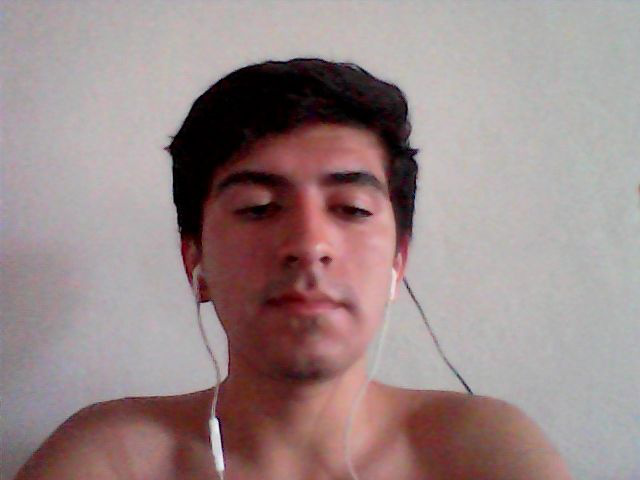

Emotions:
 angry: 6.90%
 disgust: 0.08%
 fear: 8.71%
 happiness: 2.16%
 sadness: 19.23%
 surprise: 1.01%
 neutral: 61.92%
Location face:  [[197 117 227 227]]


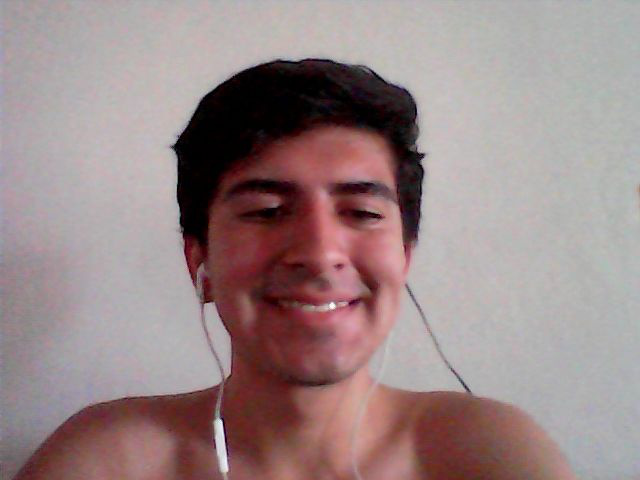

Emotions:
 angry: 0.07%
 disgust: 0.00%
 fear: 0.09%
 happiness: 97.88%
 sadness: 0.22%
 surprise: 0.06%
 neutral: 1.68%
Location face:  [[198 114 237 237]]


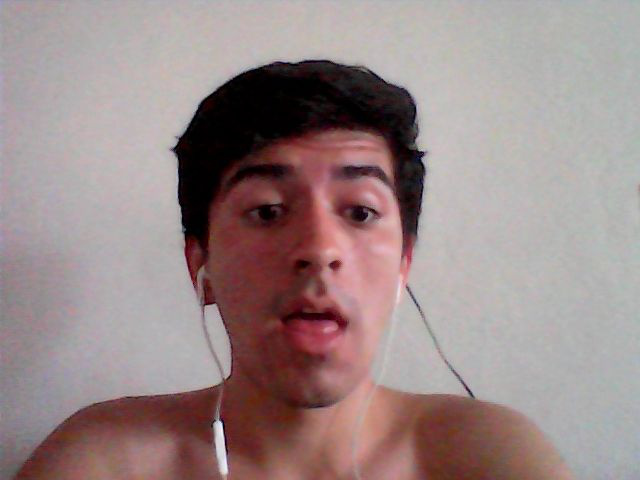

Emotions:
 angry: 6.49%
 disgust: 0.57%
 fear: 33.01%
 happiness: 2.23%
 sadness: 14.84%
 surprise: 26.31%
 neutral: 16.55%
Location face:  [[191 113 265 265]]


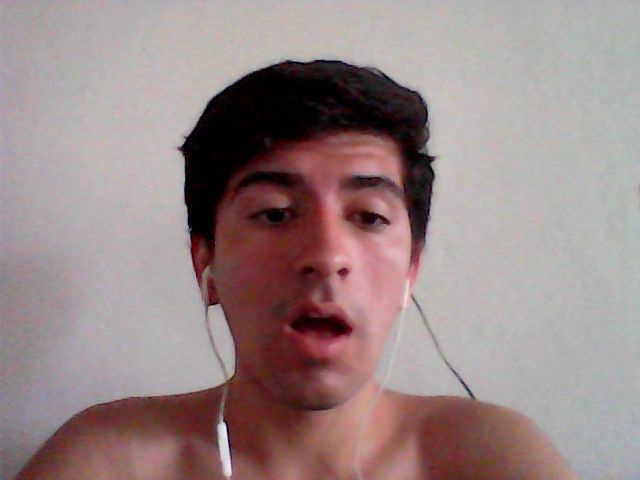

Emotions:
 angry: 0.96%
 disgust: 0.05%
 fear: 13.17%
 happiness: 1.56%
 sadness: 1.97%
 surprise: 76.25%
 neutral: 6.05%
Location face:  [[193 109 269 269]]


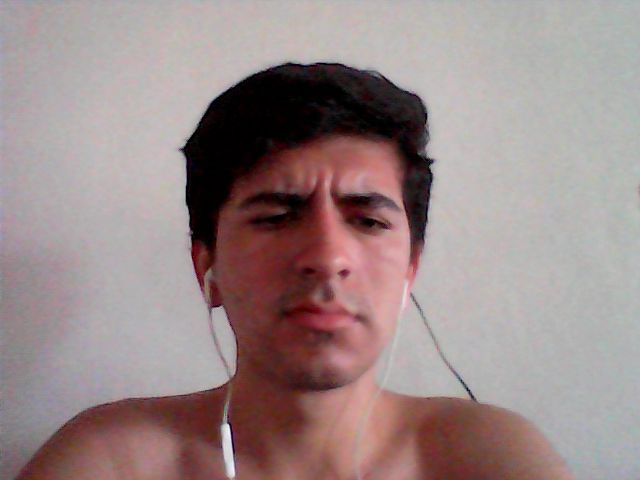

Emotions:
 angry: 35.37%
 disgust: 1.48%
 fear: 15.06%
 happiness: 0.45%
 sadness: 25.85%
 surprise: 2.21%
 neutral: 19.58%
Location face:  [[201 115 255 255]]


DATA:
Name: Javier
ID: 34
BirthDay entered: 12-05-1995
Age (In years old): 28
Nacionality: CR
Cellphone: 
 Cellphone-1: Cellphone-1 
Emails:
 fsd@gmail.com
Location: ['fsd@gmail.com']
Civil Status: Single
Children: 
Pedro  data: 
Gender: Male
BirthDay: 10-05-2009
Images Captured: ------------------------------------------------------


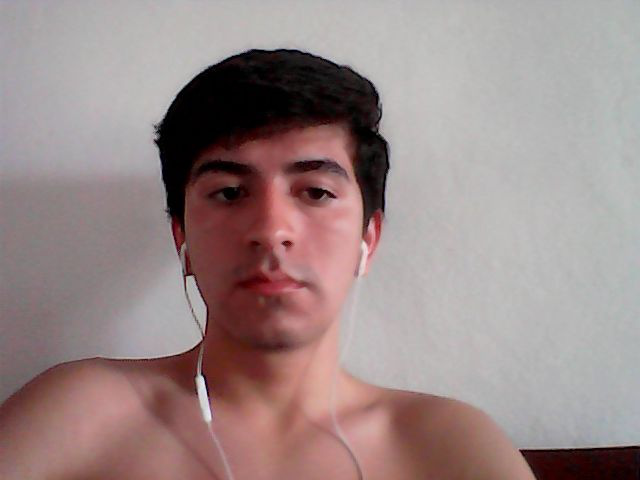

Emotions:
 angry: 2.16%
 disgust: 0.01%
 fear: 3.01%
 happiness: 0.58%
 sadness: 7.74%
 surprise: 0.39%
 neutral: 86.11%
Location face:  [[167 108 214 214]]


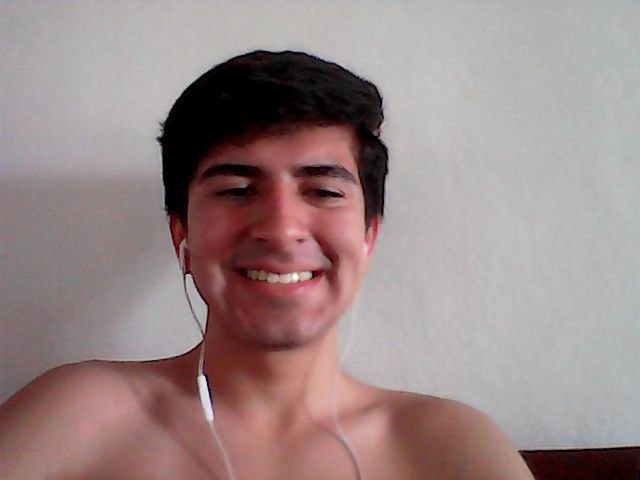

Emotions:
 angry: 0.03%
 disgust: 0.00%
 fear: 0.02%
 happiness: 98.69%
 sadness: 0.05%
 surprise: 0.03%
 neutral: 1.19%
Location face:  [[179 109 201 201]]


DATA:
Name: Adrian
ID: Adrian
BirthDay entered: 10-04-1992
Age (In years old): 31
Nacionality: Peru
Cellphone: 
 Cellphone-1: Cellphone-1 
Emails:
 adri@hotmail.com
Location: ['adri@hotmail.com']
Civil Status: Single
Dont have children
Images Captured: ------------------------------------------------------


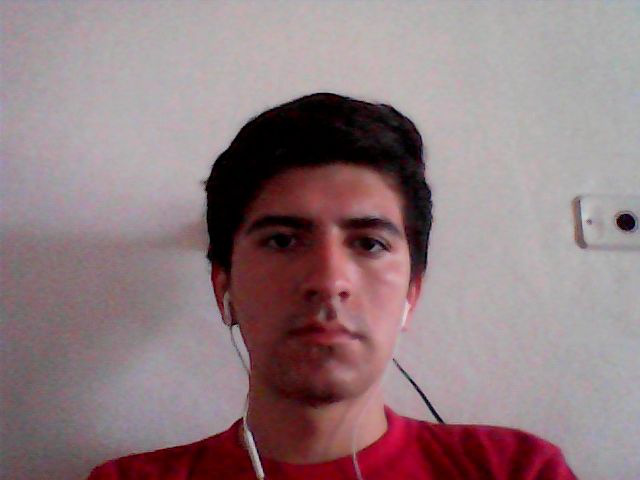

Emotions:
 angry: 8.41%
 disgust: 0.06%
 fear: 6.87%
 happiness: 0.63%
 sadness: 14.75%
 surprise: 1.03%
 neutral: 68.25%
Location face:  [[222 155 219 219]]


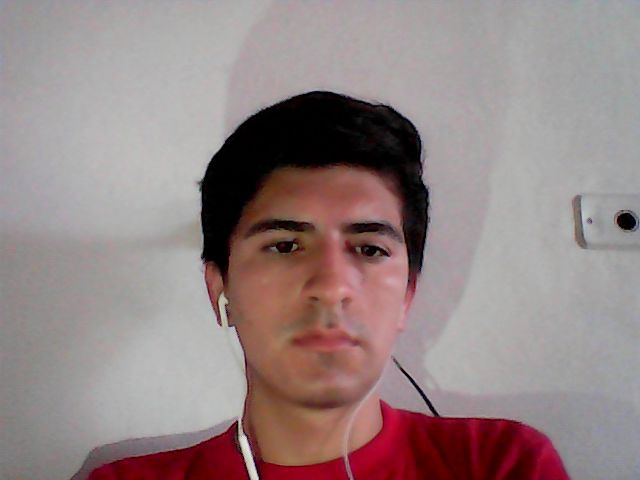

Emotions:
 angry: 6.86%
 disgust: 0.03%
 fear: 5.01%
 happiness: 0.87%
 sadness: 16.81%
 surprise: 0.27%
 neutral: 70.15%
Location face:  [[209 158 236 236]]


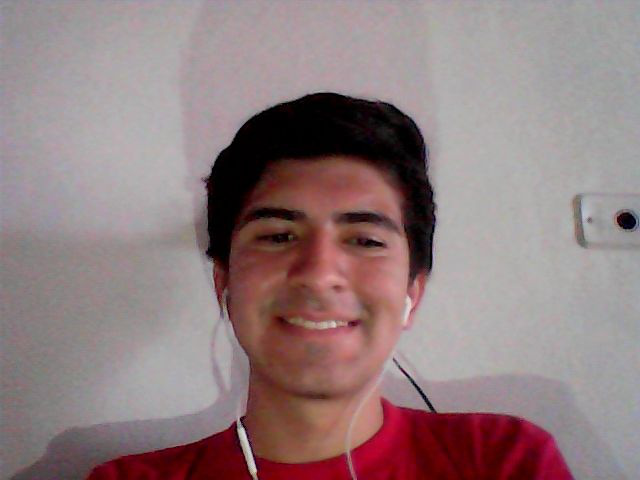

Emotions:
 angry: 0.02%
 disgust: 0.00%
 fear: 0.01%
 happiness: 97.95%
 sadness: 0.03%
 surprise: 0.02%
 neutral: 1.97%
Location face:  [[216 154 217 217]]


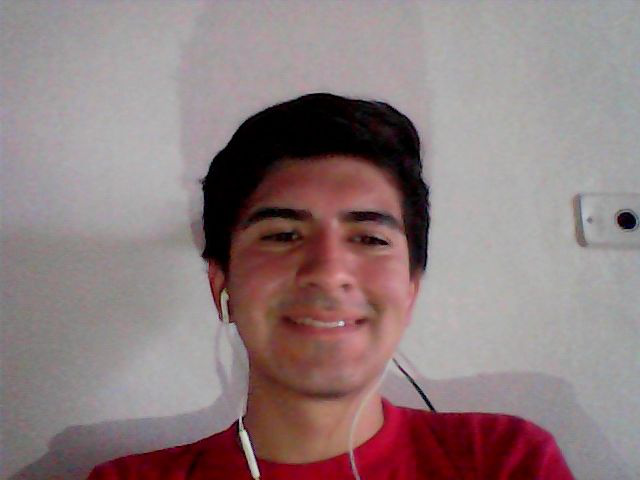

Emotions:
 angry: 0.01%
 disgust: 0.00%
 fear: 0.00%
 happiness: 98.33%
 sadness: 0.01%
 surprise: 0.01%
 neutral: 1.63%
Location face:  [[217 149 223 223]]


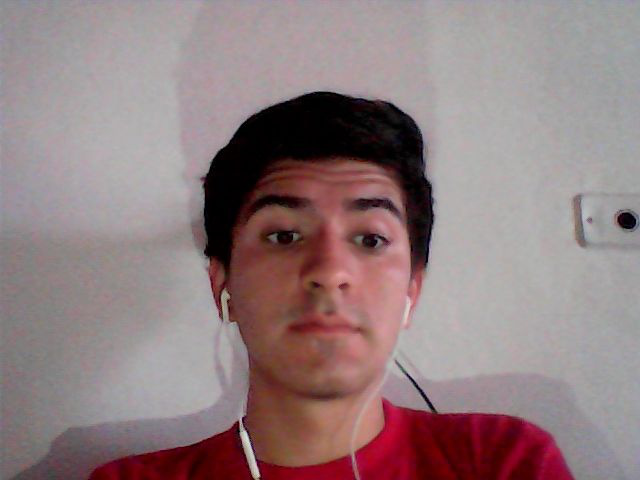

Emotions:
 angry: 3.77%
 disgust: 0.02%
 fear: 4.01%
 happiness: 1.43%
 sadness: 8.27%
 surprise: 1.13%
 neutral: 81.37%
Location face:  [[210 146 243 243]]




In [381]:
from PIL import Image 
import pickle


#Diccionary for testing

userList1 = loadIntervieweds()

def order_userData(userList):

  """
  Displays the captured information in a way that is interpretable to the user.

  Args:
  userList: userList is a general list containing the collected user data.

  Output:
  Show each individual data with its respective title or key

  """

  for i in userList:

    print("DATA:")

    print(f"Name: {i.name}")  #Imprimir nombre de usuario que posee la lista
    print(f"ID: {i.id}")
    print(f"BirthDay entered: {i.birthDay}")
    print(f"Age (In years old): {i.calcularEdad()}")
    print(f"Nacionality: {i.nacionality}")

    print("Cellphone: ")
    for x in i.cellphones:
     number = str(x)
     print(f" {x}: {number} ")
  
    print("Emails:")
    for x in i.emails:
      print(f" {x}")

    print(f"Location: {i.emails}")
    print(f"Civil Status: {i.civilStatus}")

    if i.childrenData == {}:
      print("Dont have children")
    else:
      print("Children: ")
      childrenList = list(i.childrenData)
      childrenOrder = 0
      for w in childrenList:
        print(childrenList[childrenOrder], " data: ")
        print(f"Gender: {i.childrenData[childrenList[childrenOrder]]['gender']}")
        print(f"BirthDay: {i.childrenData[childrenList[childrenOrder]]['birthDay']}")
        childrenOrder += 1
      # for w in childrenList:
        # print(w)


    print("Images Captured: ------------------------------------------------------")

    for y in i.photoData:
      for z in y:
        urlImg = list(z.items())[0][1]
        emotionsDict = list(z.items())[1][1]
        locationFace = list(z.items())[2][1]

        img = Image.open(urlImg)
        img.show() 

        emotions = list(emotionsDict.keys())
        print("Emotions:")
        for e in emotions:
        
          print(f" {e}: {'{:.2f}'.format(emotionsDict[e] * 100)}%")

        print("Location face: ",locationFace)
    print("\n")

order_userData(userList1)

**2)**

DATA:
Name: Nahum
ID: 12
BirthDay entered: 30-08-2004
Age (In years old): 18
Nacionality: CR
Cellphone: 
 Cellphone-1: Cellphone-1 
Emails:
 n4hummuro227@gmail.com
 namurillo@estudiantec.cr
Location: ['n4hummuro227@gmail.com', 'namurillo@estudiantec.cr']
Civil Status: Single
Dont have children
Images Captured: ------------------------------------------------------


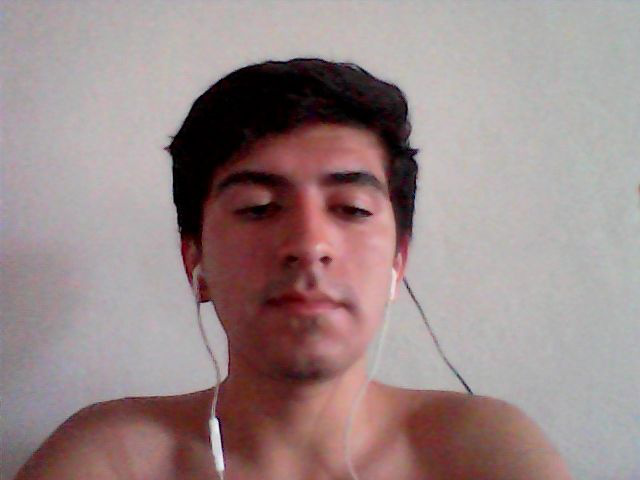

Emotions:
 angry: 6.90%
 disgust: 0.08%
 fear: 8.71%
 happiness: 2.16%
 sadness: 19.23%
 surprise: 1.01%
 neutral: 61.92%
Location face:  [[197 117 227 227]]


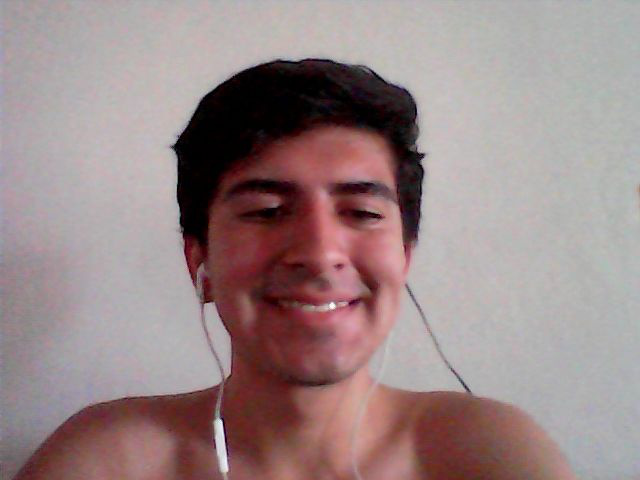

Emotions:
 angry: 0.07%
 disgust: 0.00%
 fear: 0.09%
 happiness: 97.88%
 sadness: 0.22%
 surprise: 0.06%
 neutral: 1.68%
Location face:  [[198 114 237 237]]


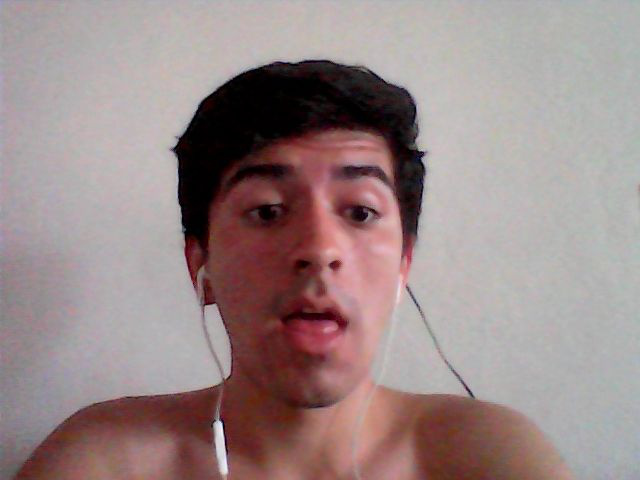

Emotions:
 angry: 6.49%
 disgust: 0.57%
 fear: 33.01%
 happiness: 2.23%
 sadness: 14.84%
 surprise: 26.31%
 neutral: 16.55%
Location face:  [[191 113 265 265]]


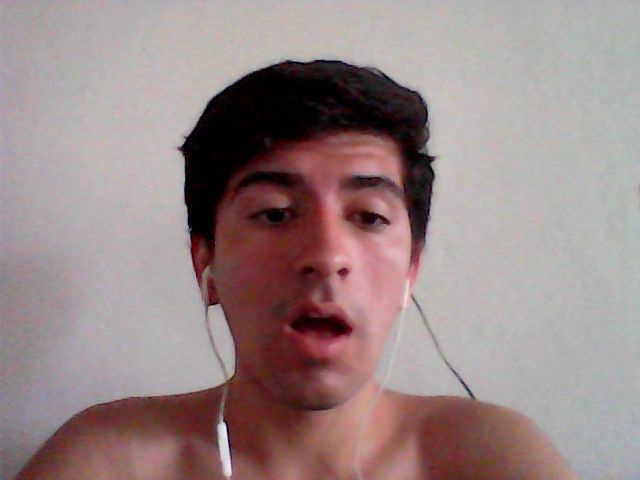

Emotions:
 angry: 0.96%
 disgust: 0.05%
 fear: 13.17%
 happiness: 1.56%
 sadness: 1.97%
 surprise: 76.25%
 neutral: 6.05%
Location face:  [[193 109 269 269]]


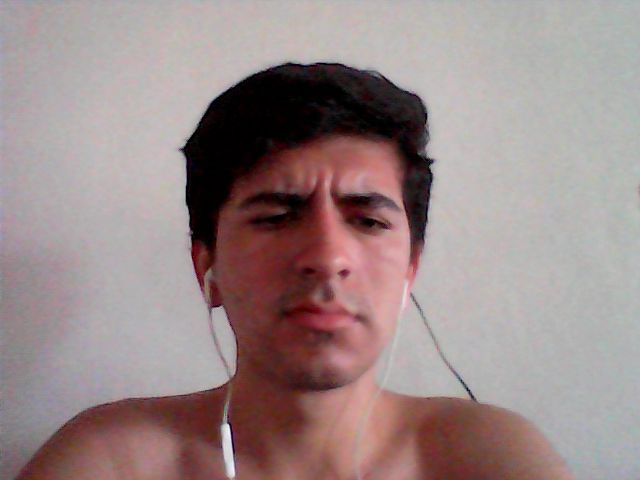

Emotions:
 angry: 35.37%
 disgust: 1.48%
 fear: 15.06%
 happiness: 0.45%
 sadness: 25.85%
 surprise: 2.21%
 neutral: 19.58%
Location face:  [[201 115 255 255]]


DATA:
Name: Javier
ID: 34
BirthDay entered: 12-05-1995
Age (In years old): 28
Nacionality: CR
Cellphone: 
 Cellphone-1: Cellphone-1 
Emails:
 fsd@gmail.com
Location: ['fsd@gmail.com']
Civil Status: Single
Children: 
Pedro  data: 
Gender: Male
BirthDay: 10-05-2009
Images Captured: ------------------------------------------------------


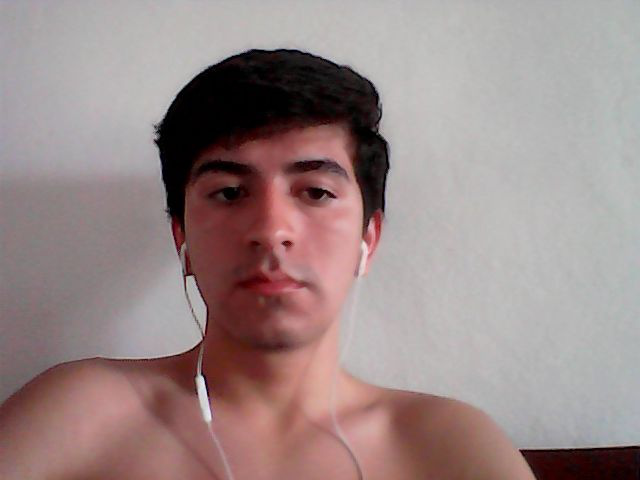

Emotions:
 angry: 2.16%
 disgust: 0.01%
 fear: 3.01%
 happiness: 0.58%
 sadness: 7.74%
 surprise: 0.39%
 neutral: 86.11%
Location face:  [[167 108 214 214]]


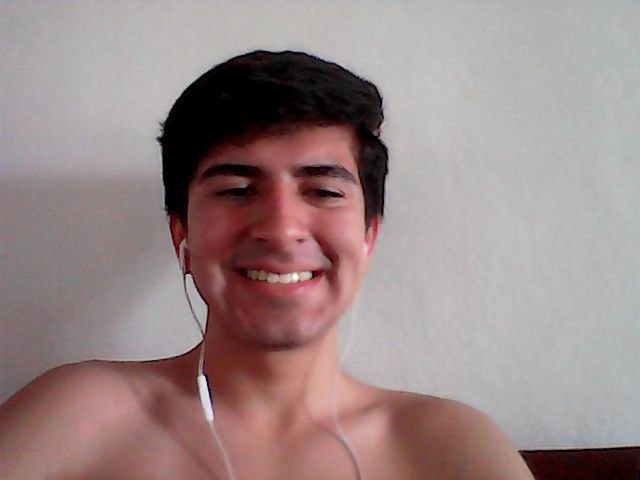

Emotions:
 angry: 0.03%
 disgust: 0.00%
 fear: 0.02%
 happiness: 98.69%
 sadness: 0.05%
 surprise: 0.03%
 neutral: 1.19%
Location face:  [[179 109 201 201]]


DATA:
Name: Adrian
ID: Adrian
BirthDay entered: 10-04-1992
Age (In years old): 31
Nacionality: Peru
Cellphone: 
 Cellphone-1: Cellphone-1 
Emails:
 adri@hotmail.com
Location: ['adri@hotmail.com']
Civil Status: Single
Dont have children
Images Captured: ------------------------------------------------------


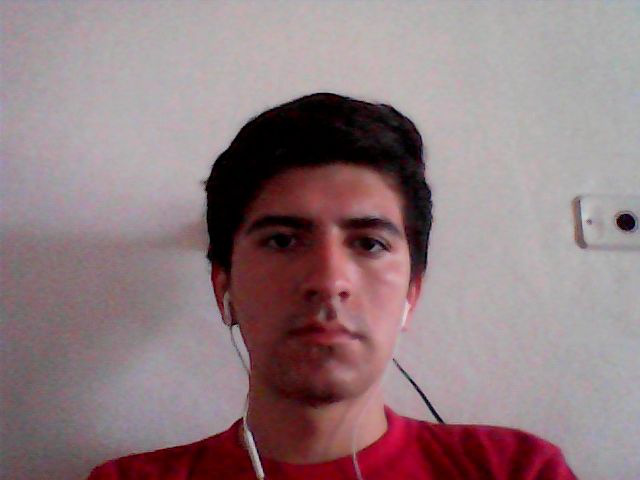

Emotions:
 angry: 8.41%
 disgust: 0.06%
 fear: 6.87%
 happiness: 0.63%
 sadness: 14.75%
 surprise: 1.03%
 neutral: 68.25%
Location face:  [[222 155 219 219]]


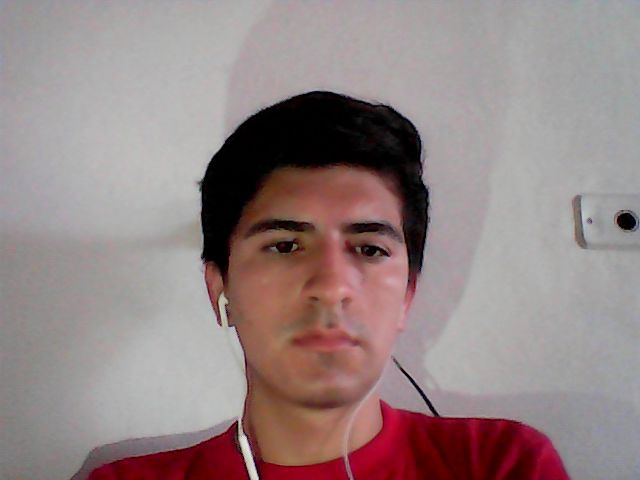

Emotions:
 angry: 6.86%
 disgust: 0.03%
 fear: 5.01%
 happiness: 0.87%
 sadness: 16.81%
 surprise: 0.27%
 neutral: 70.15%
Location face:  [[209 158 236 236]]


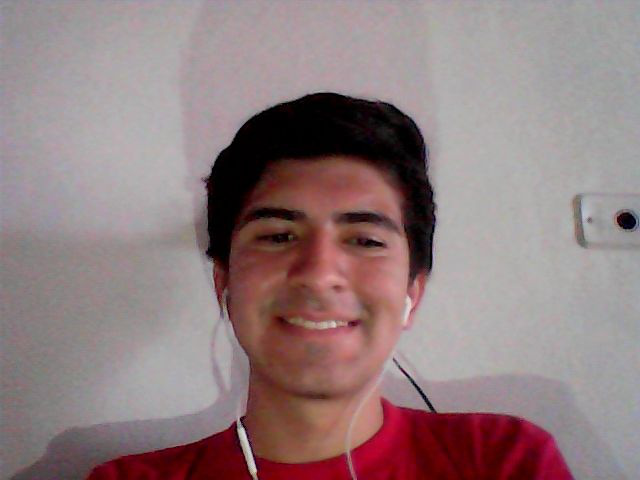

Emotions:
 angry: 0.02%
 disgust: 0.00%
 fear: 0.01%
 happiness: 97.95%
 sadness: 0.03%
 surprise: 0.02%
 neutral: 1.97%
Location face:  [[216 154 217 217]]


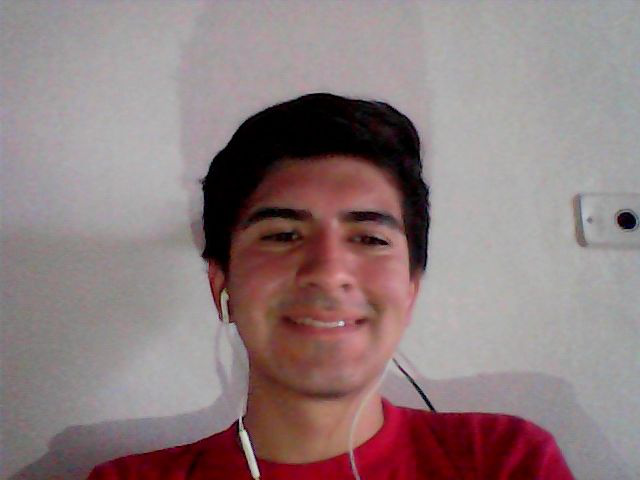

Emotions:
 angry: 0.01%
 disgust: 0.00%
 fear: 0.00%
 happiness: 98.33%
 sadness: 0.01%
 surprise: 0.01%
 neutral: 1.63%
Location face:  [[217 149 223 223]]


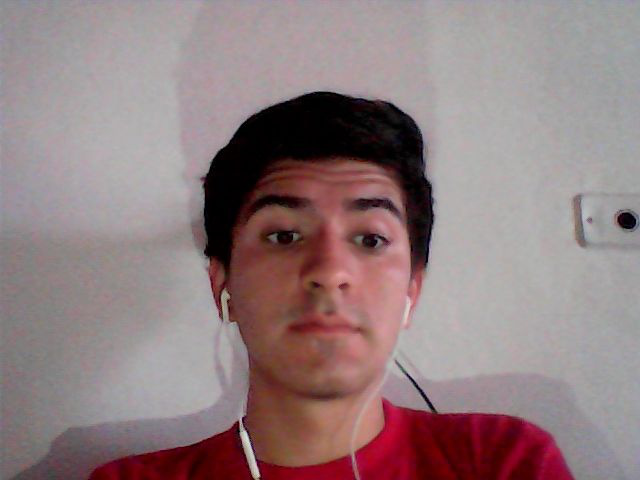

Emotions:
 angry: 3.77%
 disgust: 0.02%
 fear: 4.01%
 happiness: 1.43%
 sadness: 8.27%
 surprise: 1.13%
 neutral: 81.37%
Location face:  [[210 146 243 243]]




In [382]:
userList2 = loadIntervieweds()

def sort_by_age_insertion(lst):
    """
    sort a list of objects by insertion method according to the user's age 

    Args:
    lst = lst is a list of objects to sort

    Return:
    lst already ordered 
    """
    for i in range(0, len(lst)):
        current_value = lst[i]
        current_age = current_value.calcularEdad()
        j = i - 1
        while j >= 0 and lst[j].calcularEdad() > current_age:
            lst[j+1] = lst[j]
            j -= 1
        lst[j+1] = current_value
    return lst

sorted_data = sort_by_age_insertion(userList2)

order_userData(sorted_data)

**3)**

DATA:
Name: Javier
ID: 34
BirthDay entered: 12-05-1995
Age (In years old): 28
Nacionality: CR
Cellphone: 
 Cellphone-1: Cellphone-1 
Emails:
 fsd@gmail.com
Location: ['fsd@gmail.com']
Civil Status: Single
Children: 
Pedro  data: 
Gender: Male
BirthDay: 10-05-2009
Images Captured: ------------------------------------------------------


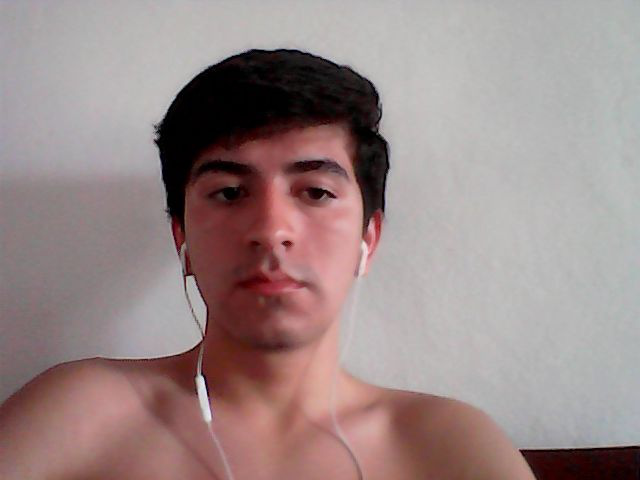

Emotions:
 angry: 2.16%
 disgust: 0.01%
 fear: 3.01%
 happiness: 0.58%
 sadness: 7.74%
 surprise: 0.39%
 neutral: 86.11%
Location face:  [[167 108 214 214]]


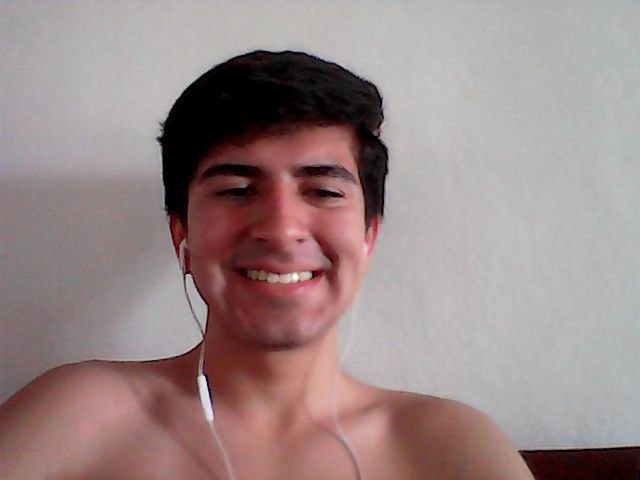

Emotions:
 angry: 0.03%
 disgust: 0.00%
 fear: 0.02%
 happiness: 98.69%
 sadness: 0.05%
 surprise: 0.03%
 neutral: 1.19%
Location face:  [[179 109 201 201]]


DATA:
Name: Nahum
ID: 12
BirthDay entered: 30-08-2004
Age (In years old): 18
Nacionality: CR
Cellphone: 
 Cellphone-1: Cellphone-1 
Emails:
 n4hummuro227@gmail.com
 namurillo@estudiantec.cr
Location: ['n4hummuro227@gmail.com', 'namurillo@estudiantec.cr']
Civil Status: Single
Dont have children
Images Captured: ------------------------------------------------------


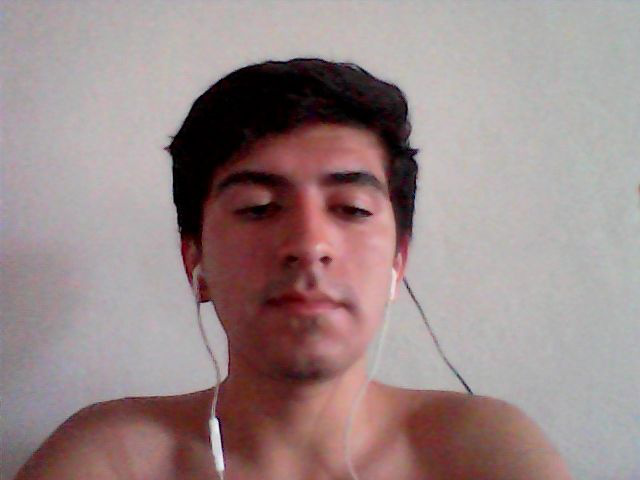

Emotions:
 angry: 6.90%
 disgust: 0.08%
 fear: 8.71%
 happiness: 2.16%
 sadness: 19.23%
 surprise: 1.01%
 neutral: 61.92%
Location face:  [[197 117 227 227]]


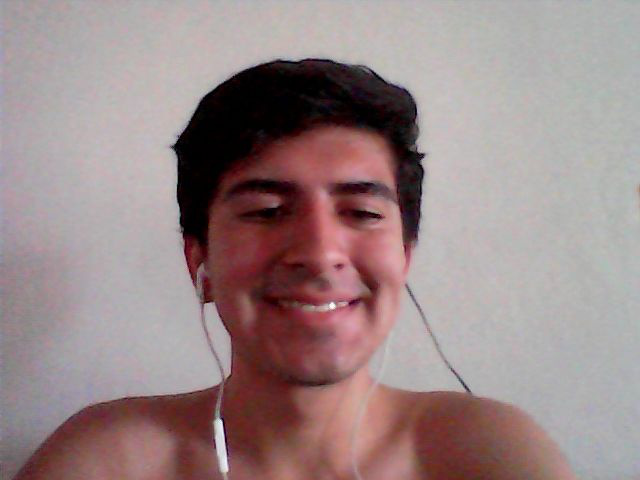

Emotions:
 angry: 0.07%
 disgust: 0.00%
 fear: 0.09%
 happiness: 97.88%
 sadness: 0.22%
 surprise: 0.06%
 neutral: 1.68%
Location face:  [[198 114 237 237]]


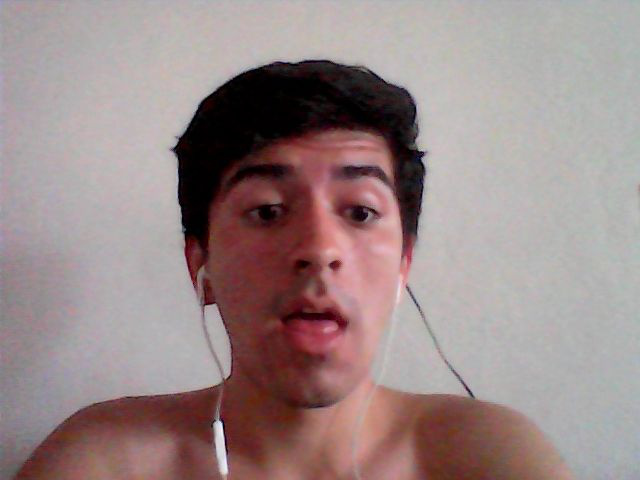

Emotions:
 angry: 6.49%
 disgust: 0.57%
 fear: 33.01%
 happiness: 2.23%
 sadness: 14.84%
 surprise: 26.31%
 neutral: 16.55%
Location face:  [[191 113 265 265]]


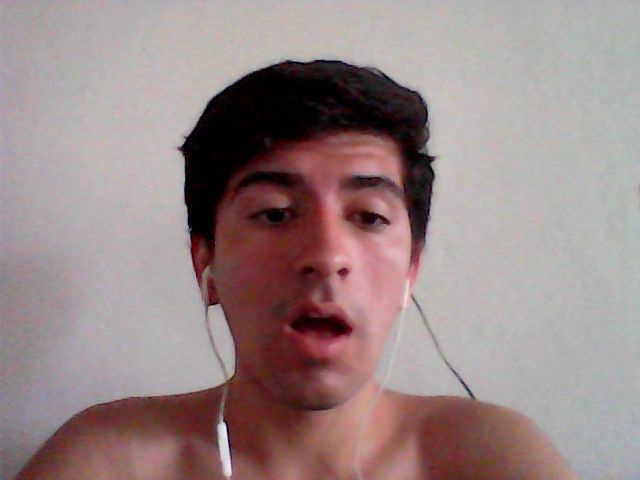

Emotions:
 angry: 0.96%
 disgust: 0.05%
 fear: 13.17%
 happiness: 1.56%
 sadness: 1.97%
 surprise: 76.25%
 neutral: 6.05%
Location face:  [[193 109 269 269]]


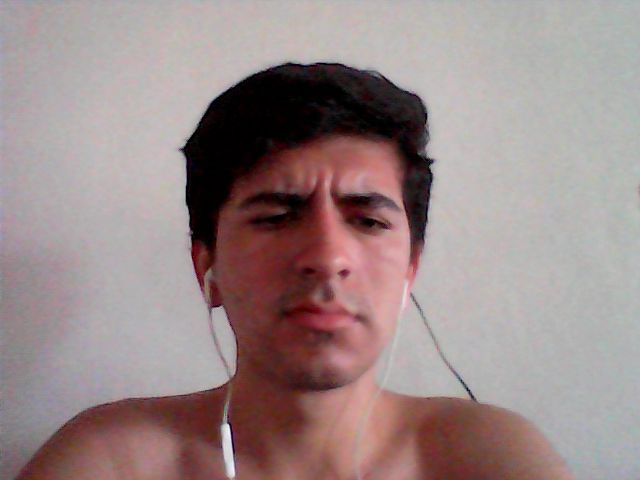

Emotions:
 angry: 35.37%
 disgust: 1.48%
 fear: 15.06%
 happiness: 0.45%
 sadness: 25.85%
 surprise: 2.21%
 neutral: 19.58%
Location face:  [[201 115 255 255]]


DATA:
Name: Adrian
ID: Adrian
BirthDay entered: 10-04-1992
Age (In years old): 31
Nacionality: Peru
Cellphone: 
 Cellphone-1: Cellphone-1 
Emails:
 adri@hotmail.com
Location: ['adri@hotmail.com']
Civil Status: Single
Dont have children
Images Captured: ------------------------------------------------------


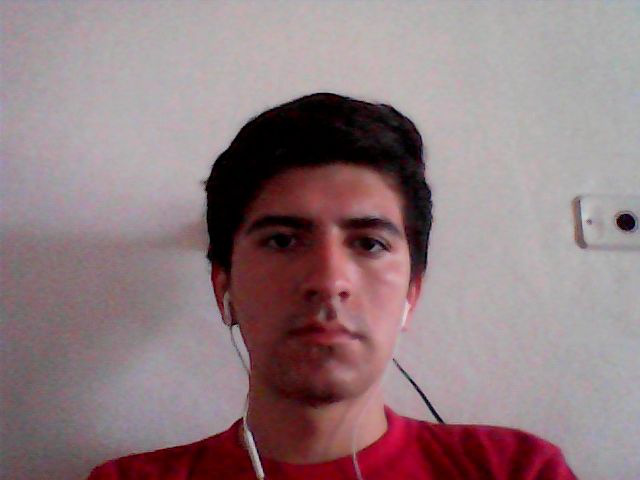

Emotions:
 angry: 8.41%
 disgust: 0.06%
 fear: 6.87%
 happiness: 0.63%
 sadness: 14.75%
 surprise: 1.03%
 neutral: 68.25%
Location face:  [[222 155 219 219]]


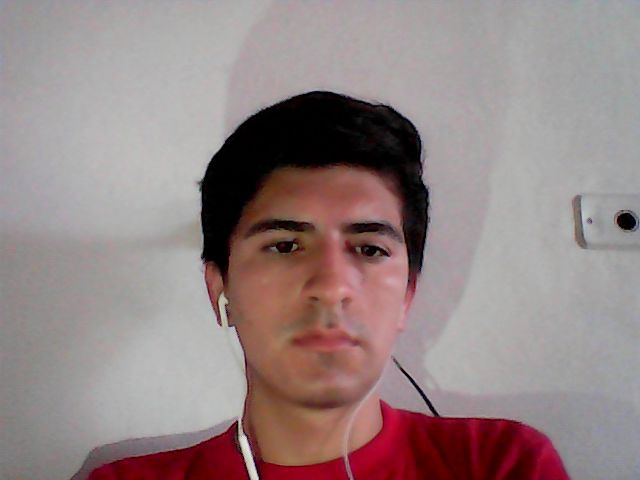

Emotions:
 angry: 6.86%
 disgust: 0.03%
 fear: 5.01%
 happiness: 0.87%
 sadness: 16.81%
 surprise: 0.27%
 neutral: 70.15%
Location face:  [[209 158 236 236]]


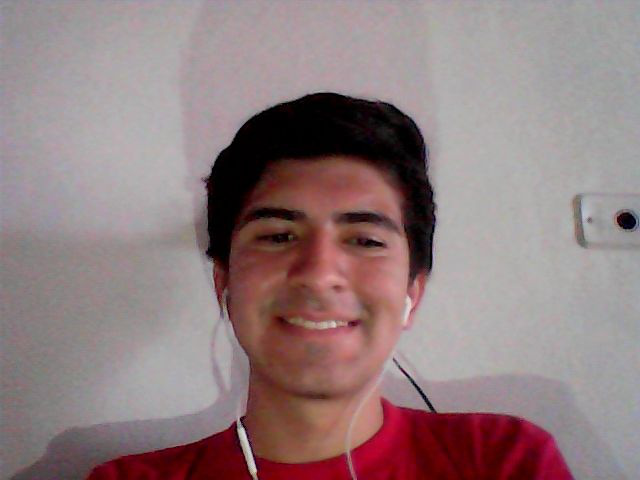

Emotions:
 angry: 0.02%
 disgust: 0.00%
 fear: 0.01%
 happiness: 97.95%
 sadness: 0.03%
 surprise: 0.02%
 neutral: 1.97%
Location face:  [[216 154 217 217]]


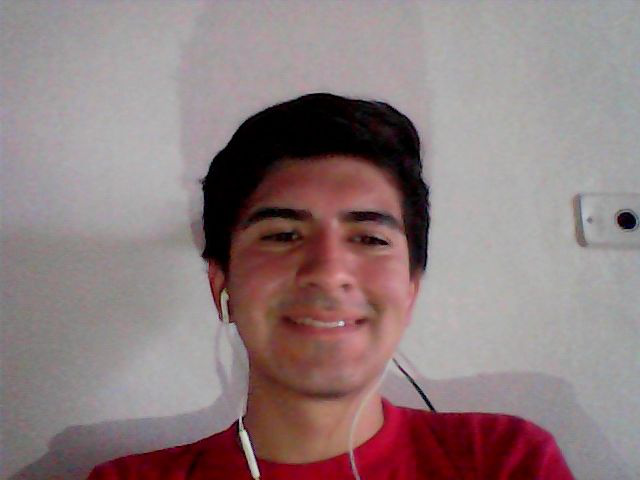

Emotions:
 angry: 0.01%
 disgust: 0.00%
 fear: 0.00%
 happiness: 98.33%
 sadness: 0.01%
 surprise: 0.01%
 neutral: 1.63%
Location face:  [[217 149 223 223]]


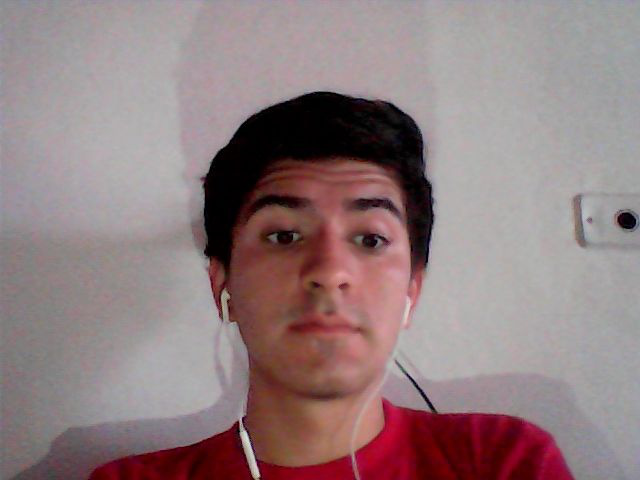

Emotions:
 angry: 3.77%
 disgust: 0.02%
 fear: 4.01%
 happiness: 1.43%
 sadness: 8.27%
 surprise: 1.13%
 neutral: 81.37%
Location face:  [[210 146 243 243]]




In [383]:
userList3 = loadIntervieweds()

"""
This block show initial list sorted in descending order of the number of children of each user using the bubble method and finally show with 'order_userData' function
"""

n = len(userList3)
for i in range(n-1):
    for j in range(n-i-1):
      if len(list(userList3[j].childrenData)) < len(list(userList3[j+1].childrenData)):
         userList3[j], userList3[j+1] = userList3[j+1], userList3[j]

order_userData(userList3)

**4)**

DATA:
Name: Javier
ID: 34
BirthDay entered: 12-05-1995
Age (In years old): 28
Nacionality: CR
Cellphone: 
 Cellphone-1: Cellphone-1 
Emails:
 fsd@gmail.com
Location: ['fsd@gmail.com']
Civil Status: Single
Children: 
Pedro  data: 
Gender: Male
BirthDay: 10-05-2009
Images Captured: ------------------------------------------------------


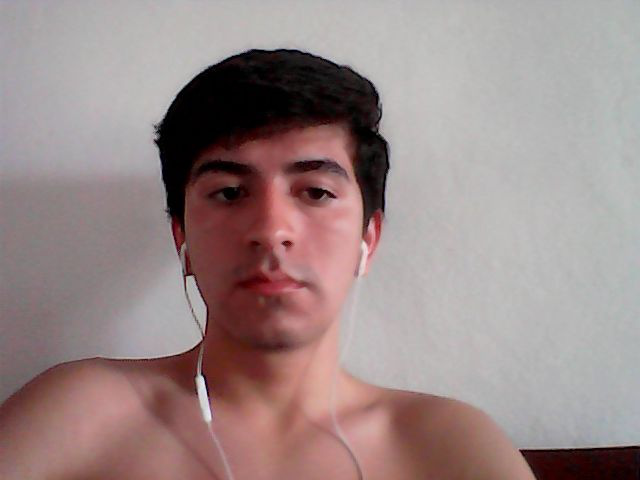

Emotions:
 angry: 2.16%
 disgust: 0.01%
 fear: 3.01%
 happiness: 0.58%
 sadness: 7.74%
 surprise: 0.39%
 neutral: 86.11%
Location face:  [[167 108 214 214]]


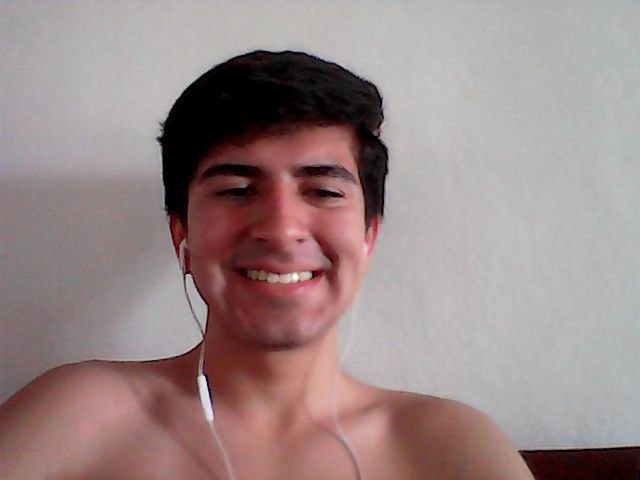

Emotions:
 angry: 0.03%
 disgust: 0.00%
 fear: 0.02%
 happiness: 98.69%
 sadness: 0.05%
 surprise: 0.03%
 neutral: 1.19%
Location face:  [[179 109 201 201]]


DATA:
Name: Nahum
ID: 12
BirthDay entered: 30-08-2004
Age (In years old): 18
Nacionality: CR
Cellphone: 
 Cellphone-1: Cellphone-1 
Emails:
 n4hummuro227@gmail.com
 namurillo@estudiantec.cr
Location: ['n4hummuro227@gmail.com', 'namurillo@estudiantec.cr']
Civil Status: Single
Dont have children
Images Captured: ------------------------------------------------------


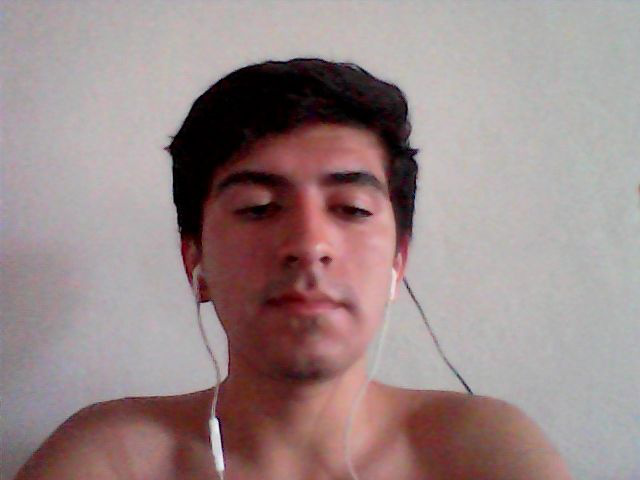

Emotions:
 angry: 6.90%
 disgust: 0.08%
 fear: 8.71%
 happiness: 2.16%
 sadness: 19.23%
 surprise: 1.01%
 neutral: 61.92%
Location face:  [[197 117 227 227]]


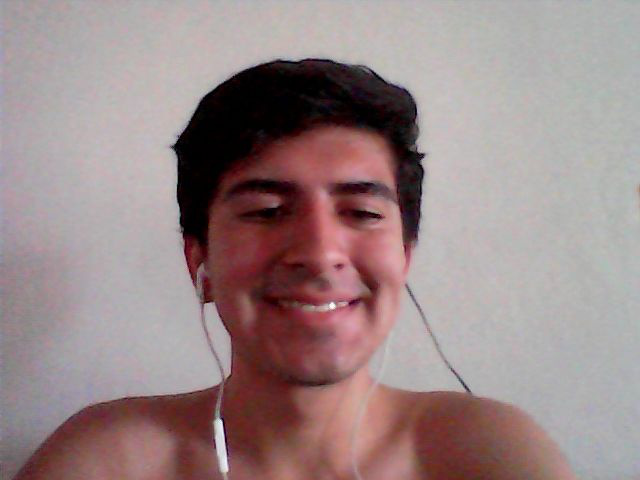

Emotions:
 angry: 0.07%
 disgust: 0.00%
 fear: 0.09%
 happiness: 97.88%
 sadness: 0.22%
 surprise: 0.06%
 neutral: 1.68%
Location face:  [[198 114 237 237]]


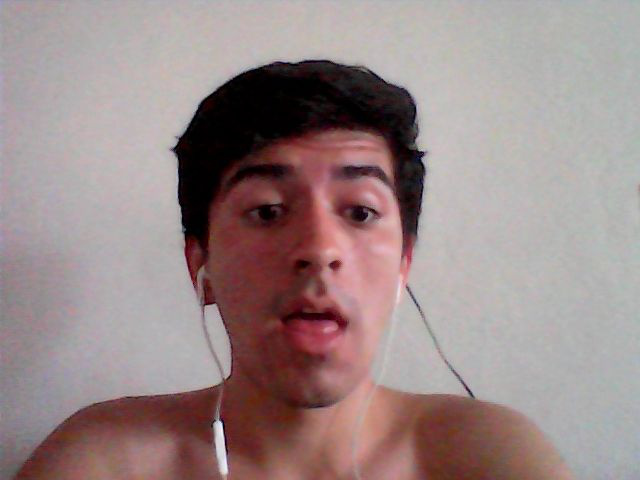

Emotions:
 angry: 6.49%
 disgust: 0.57%
 fear: 33.01%
 happiness: 2.23%
 sadness: 14.84%
 surprise: 26.31%
 neutral: 16.55%
Location face:  [[191 113 265 265]]


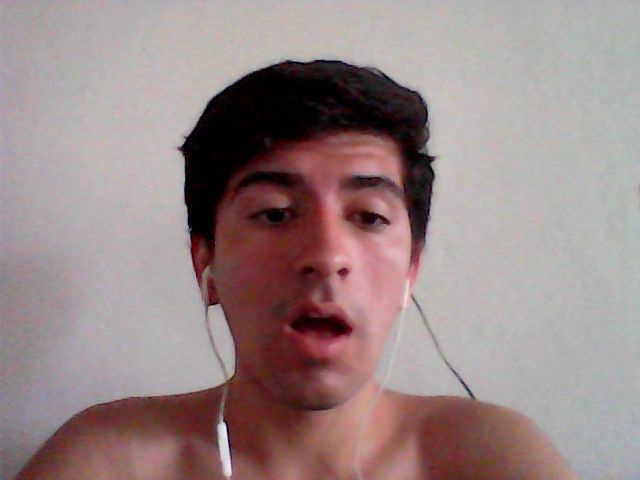

Emotions:
 angry: 0.96%
 disgust: 0.05%
 fear: 13.17%
 happiness: 1.56%
 sadness: 1.97%
 surprise: 76.25%
 neutral: 6.05%
Location face:  [[193 109 269 269]]


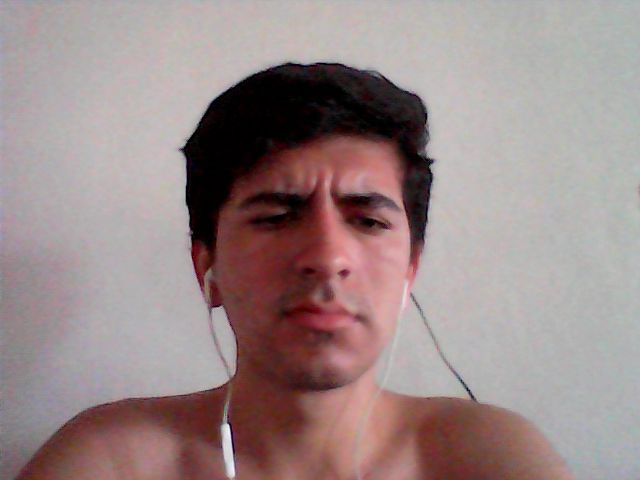

Emotions:
 angry: 35.37%
 disgust: 1.48%
 fear: 15.06%
 happiness: 0.45%
 sadness: 25.85%
 surprise: 2.21%
 neutral: 19.58%
Location face:  [[201 115 255 255]]


DATA:
Name: Adrian
ID: Adrian
BirthDay entered: 10-04-1992
Age (In years old): 31
Nacionality: Peru
Cellphone: 
 Cellphone-1: Cellphone-1 
Emails:
 adri@hotmail.com
Location: ['adri@hotmail.com']
Civil Status: Single
Dont have children
Images Captured: ------------------------------------------------------


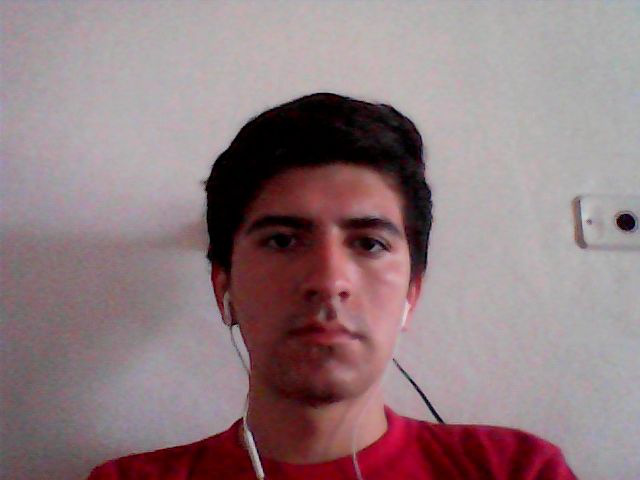

Emotions:
 angry: 8.41%
 disgust: 0.06%
 fear: 6.87%
 happiness: 0.63%
 sadness: 14.75%
 surprise: 1.03%
 neutral: 68.25%
Location face:  [[222 155 219 219]]


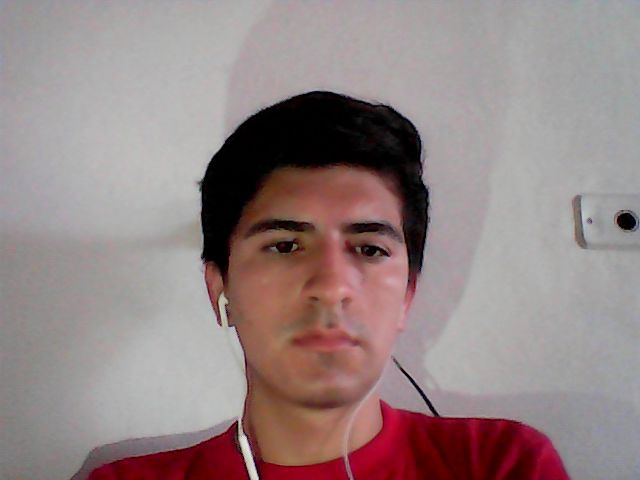

Emotions:
 angry: 6.86%
 disgust: 0.03%
 fear: 5.01%
 happiness: 0.87%
 sadness: 16.81%
 surprise: 0.27%
 neutral: 70.15%
Location face:  [[209 158 236 236]]


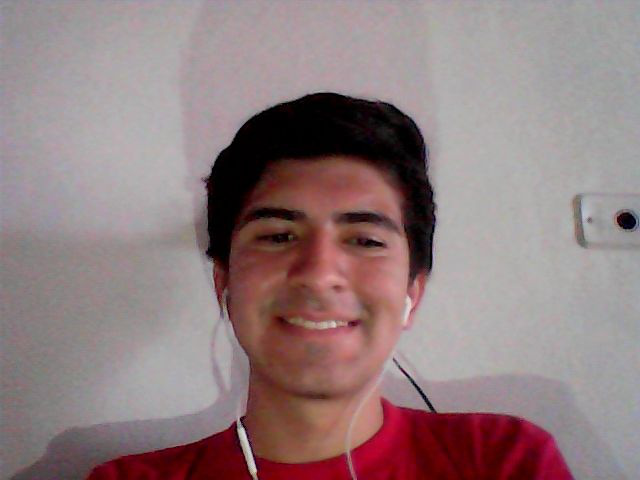

Emotions:
 angry: 0.02%
 disgust: 0.00%
 fear: 0.01%
 happiness: 97.95%
 sadness: 0.03%
 surprise: 0.02%
 neutral: 1.97%
Location face:  [[216 154 217 217]]


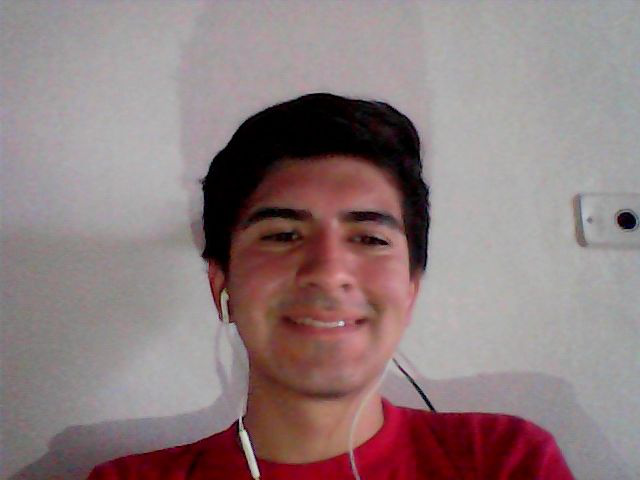

Emotions:
 angry: 0.01%
 disgust: 0.00%
 fear: 0.00%
 happiness: 98.33%
 sadness: 0.01%
 surprise: 0.01%
 neutral: 1.63%
Location face:  [[217 149 223 223]]


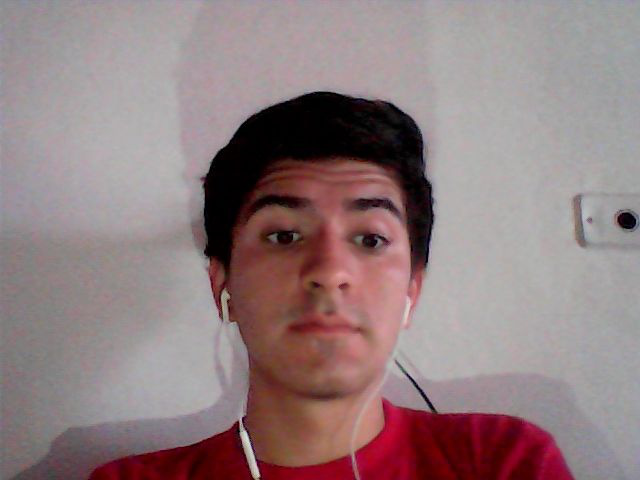

Emotions:
 angry: 3.77%
 disgust: 0.02%
 fear: 4.01%
 happiness: 1.43%
 sadness: 8.27%
 surprise: 1.13%
 neutral: 81.37%
Location face:  [[210 146 243 243]]




In [384]:
userList4 = loadIntervieweds()

def sort_by_children_quicksort(lst):
    """
    Sort list in descending order of the number of children of each user using the insertion method

    Args:
    lst: lst = lst is a list to sort

    Return:
    List already sorted
    """
    if len(lst) <= 1:
        return lst
    else:
        pivot = len(list(lst[0].childrenData))
        left_lst = []
        right_lst = []
        for i in range(1, len(lst)):
            current_children = len(list(lst[i].childrenData))
            if current_children > pivot:
                left_lst.append(lst[i])
            else:
                right_lst.append(lst[i])
        return sort_by_children_quicksort(left_lst) + [lst[0]] + sort_by_children_quicksort(right_lst)

sorted_data = sort_by_children_quicksort(userList4)

order_userData(sorted_data)

**5)**

In [387]:
"""
This block obtains for each person interviewed the disordered emotions and stores them in a list (one list per person) with sub-lists,
in the first sub-list it places the identification, name, sex and age of the person interviewed, in the following sub-lists it places
the emotions collected from each person.
"""

listWithSublists = []

userList5 = loadIntervieweds()
for user in userList5:
  userListGeneral = []

  listUserData = []
  listUserEmotions = []

  userName = user.name
  userId = user.id
  userAge = user.calcularEdad()

  listUserData.append(userName)
  listUserData.append(userId)
  listUserData.append(userAge)


  emotions = user.photoData
  for e in emotions:
    userEmotionsSublist = []
    emotionsList = list(e[0]['emotions'])
    for eL in emotionsList:
      userEmotionsSublist.append(e[0]['emotions'][eL])
    
    listUserEmotions.append(userEmotionsSublist)

  userListGeneral.append(listUserData)
  userListGeneral.append(listUserEmotions)

  listWithSublists.append(userListGeneral)
  
  # for e in emotions:      
    # print(f" {e}: {'{:.2f}'.format(emotionsDict[e] * 100)}%")

for sublist in listWithSublists:
  for data in sublist:
    index = 0
    for idata in data:
      if isinstance(idata, list):
          print("\n")
          print(f"Image {index+1}")
          print(f"Angry: {idata[0]}")
          print(f"Disgust: {idata[1]}")
          print(f"Fear: {idata[2]}")
          print(f"Happiness: {idata[3]}")
          print(f"Sadness: {idata[4]}")
          print(f"Surprise: {idata[5]}")
          print(f"Neutral: {idata[6]}")
          index += 1
      elif idata == data[0]:
        print("Name: ",idata)
      elif idata == data[1]:
        print("ID: ", idata)
      elif idata == data[2]:
        print("Age: ", idata)
  print("\n")
  print("\n")


Name:  Nahum
ID:  12
Age:  18


Image 1
Angry: 0.06896820664405823
Disgust: 0.0007586266146972775
Fear: 0.08709442615509033
Happiness: 0.021584926173090935
Sadness: 0.19230866432189941
Surprise: 0.010090621188282967
Neutral: 0.6191945672035217


Image 2
Angry: 0.0006881702574901283
Disgust: 1.117546435125405e-05
Fear: 0.0009289647568948567
Happiness: 0.978777289390564
Sadness: 0.00223087752237916
Surprise: 0.0005947580211795866
Neutral: 0.016768770292401314


Image 3
Angry: 0.06492079794406891
Disgust: 0.00565395737066865
Fear: 0.3301266133785248
Happiness: 0.022322235628962517
Sadness: 0.14843600988388062
Surprise: 0.2630688548088074
Neutral: 0.16547155380249023


Image 4
Angry: 0.009565971791744232
Disgust: 0.00048368857824243605
Fear: 0.13166385889053345
Happiness: 0.015580161474645138
Sadness: 0.01972895674407482
Surprise: 0.7624945044517517
Neutral: 0.06048286333680153


Image 5
Angry: 0.353719025850296
Disgust: 0.014794000424444675
Fear: 0.15061375498771667
Happiness: 0.004470092

**6)**

In [389]:
def quicksort(list1):
    """
    This function takes a list of items and sorts them using the quicksort algorithm.

    Args:
    list1: List of items to be sorted.

    Returns:
    list: Sorted list of items.
    """
    if len(list1) <= 1:
        return list1
    else:
        pivote = list1[0]
        left = []
        right = []
        for i in range(1, len(list1)):
            if list1[i][4] < pivote[4]:
                left.append(list1[i])
            else:
                right.append(list1[i])
        return quicksort(left) + [pivote] + quicksort(right)

indice = 0
for x in listWithSublists:
  listaOrdenada = quicksort(listWithSublists[indice][1])
  listWithSublists[indice].pop(1)
  listWithSublists[indice].insert(1, listaOrdenada)
  indice += 1

for sublist in listWithSublists:
  for data in sublist:
    index = 0
    for idata in data:
      if isinstance(idata, list):
          print(f"Image {index+1}")
          print(f"Angry: {idata[0]}")
          print(f"Disgust: {idata[1]}")
          print(f"Fear: {idata[2]}")
          print(f"Happiness: {idata[3]}")
          print(f"Sadness: {idata[4]}")
          print(f"Surprise: {idata[5]}")
          print(f"Neutral: {idata[6]}")
          index += 1
      elif idata == data[0]:
        print("Name: ",idata)
      elif idata == data[1]:
        print("ID: ", idata)
      elif idata == data[2]:
        print("Age: ", idata)
  print("\n")


Name:  Nahum
ID:  12
Age:  18
Image 1
Angry: 0.0006881702574901283
Disgust: 1.117546435125405e-05
Fear: 0.0009289647568948567
Happiness: 0.978777289390564
Sadness: 0.00223087752237916
Surprise: 0.0005947580211795866
Neutral: 0.016768770292401314
Image 2
Angry: 0.009565971791744232
Disgust: 0.00048368857824243605
Fear: 0.13166385889053345
Happiness: 0.015580161474645138
Sadness: 0.01972895674407482
Surprise: 0.7624945044517517
Neutral: 0.06048286333680153
Image 3
Angry: 0.06492079794406891
Disgust: 0.00565395737066865
Fear: 0.3301266133785248
Happiness: 0.022322235628962517
Sadness: 0.14843600988388062
Surprise: 0.2630688548088074
Neutral: 0.16547155380249023
Image 4
Angry: 0.06896820664405823
Disgust: 0.0007586266146972775
Fear: 0.08709442615509033
Happiness: 0.021584926173090935
Sadness: 0.19230866432189941
Surprise: 0.010090621188282967
Neutral: 0.6191945672035217
Image 5
Angry: 0.353719025850296
Disgust: 0.014794000424444675
Fear: 0.15061375498771667
Happiness: 0.004470092710107565


**7)**

In [390]:
import plotly.graph_objects as go

def graphic_quarter(numbers, labels, pos, userName):
    """
    This function takes a list of numbers and labels, along with a position and a name, and plots a bar chart 
    using Plotly.

    Args:
    numbers: A list of numbers representing the values of the bars.
    labels: A list of labels representing the names of the bars.
    pos: A list of positions representing the location of the bars in the chart.
    userName: A string representing the name of the chart.

    Output:
    Show user graphic
    """
    fig = go.Figure(data=[go.Bar(x=labels, y=numbers)])
    fig.update_layout(title=f'Average Emotions ({userName}) - 0/10')
    fig.show()

#Create emotionList - Average numbers

userList7 = loadIntervieweds()

for i in userList7:

  n = 1 #Length

  avFear = 0
  avDisgust = 0
  avAngry = 0
  avHappiness = 0
  avSadness = 0
  avSurprise = 0 
  avNeutral = 0

  nombre = i.name
  for j in i.photoData:
    emotions = list(j[0]["emotions"].keys())
    for z in emotions:
       if z == "fear":
         avFear += j[0]["emotions"][z]
       elif z == "disgust":
         avDisgust += j[0]["emotions"][z]
       elif z == "angry":
         avAngry += j[0]["emotions"][z]
       elif z == "happiness":
         avHappiness += j[0]["emotions"][z]
       elif z == "sadness":
         avSadness += j[0]["emotions"][z]
       elif z == "surprise":
         avSurprise += j[0]["emotions"][z]
       elif z == "neutral":
         avNeutral  += j[0]["emotions"][z]
       n += 1

  avFear = avFear / n
  avDisgust = avDisgust / n
  avAngry = avAngry / n
  avHappiness = avHappiness / n
  avSadness = avSadness / n
  avSurprise = avSurprise / n
  avNeutral = avNeutral / n

  if __name__ == '__main__':
    listaEmociones = [avFear*100, avDisgust*100, avAngry*100, avHappiness*100, avSadness*100, avSurprise*100, avNeutral*100]
    labels = ['Fear', 'Disgust', 'Angry', 'Happiness','Sadness', 'Surprise', 'Neutral']
    graphic_quarter(listaEmociones, labels, [], nombre)
    print(" ")

**9)**

In [378]:
def agregarNuevoUsuario():

    newInterviewed = Interviewed()

    userList = loadIntervieweds()
    userFound = False

    for i in range(len(userList)):
        if userList[i].id == newInterviewed.id:
            userList[i] = newInterviewed
            userFound = True
            saveInFileData(newInterviewed)
            break

    if not userFound:
        with open("/content/drive/MyDrive/projectFiles/personsCapturedData/Archivo_Entrevistado.bin", "ab") as f:
            pickle.dump(newInterviewed, f)
            print("Nuevo usuario agregado correctamente")

    print("\n -------ATENCIÓN---------- \n * \n ** \n *** \n Ir al segmento de la cámara y realizar la entrevista nuevamente. \n *** \n ** \n *")

agregarNuevoUsuario()

Enter your ID: Adrian
Enter your name: Adrian
Gender (Male/Female): Male
Enter your birthDay (format: DD-MM-YYYY): 10-04-1992
Enter your nacionality: Peru
Enter your address: Cusco, Peru
Native Lenguage: Spanish
Enter your civil status: Single
Cellphone: 1234-5678
You want add another cellphone number? Y/N: N
Email: adri@hotmail.com
You want add another email? Y/N: N
Do you have children? Y/N: N

 -------ATENCIÓN---------- 
 * 
 ** 
 *** 
 Ir al segmento de la cámara y realizar la entrevista nuevamente. 
 *** 
 ** 
 *


**10)**

# Consultas


1.   Mostrar la información de todas las personas entrevistas (la información debe ser mostrada siendo saca del archivo correspondiente, debe mostrar la información en formato legible, no en estructuras y objetos). Además, debe mostrar toda la información recolectada de la persona, se debe mostrar todas las imágenes que se recolectaron durante las entrevistas, las emociones reconocidas para cada imagen y las coordenadas donde se encuentra los rostros.

2.   Mostrar la información de todas las personas entrevistas ordenada ascendentemente por edad. El método de ordenamiento a utilizar es el método por inserción (la información debe ser mostrada siendo saca de los archivos, no se debe hacer simplemente la impresión en pantalla de la información obtenida de los archivos). Además, de mostrar toda la información recolectada de la persona, se debe mostrar todas las imágenes que se recolectaron durante las entrevistas, las emociones reconocidas para cada imagen y las coordenadas donde se encuentra los rostros.

3.   Mostrar la información de todas las personas entrevistas ordenada descendente mente por la cantidad de hijos. El método de ordenamiento a utilizar es el método por de la bubuja (la información debe ser mostrada siendo saca de los archivos, no se debe hacer simplemente la impresión en pantalla de la información obtenida de los archivos). Además, de mostrar toda la información recolectada de la persona, se debe mostrar todas las imágenes que se recolectaron durante las entrevistas, las emociones reconocidas para cada imagen y las coordenadas donde se encuentra los rostros.

4. Mostrar la información de todas las personas entrevistas ordenada descendentemente por la cantidad de hijos. El método de ordenamiento a utilizar es el método por de la quicksort (la información debe ser mostrada siendo sacada de los archivos, no se debe hacer simplemente la impresión en pantalla de la información obtenida de los archivos). Además, de mostrar toda la información recolectada de la persona, se debe mostrar todas las imágenes que se recolectaron durante las entrevistas, las emociones reconocidas para cada imagen y las coordenadas donde se encuentra los rostros. También, imprimir una lista con sublistas donde la primera sublista tiene la información de las personas que tienen únicamente hijos de género femenino, la segunda sublista tiene información de personas que tienen únicamente hijos de género masculino y la última sublista tiene información de personas que tienen hijos tanto de género femenino como másculino. 

5. Obtener para cada persona entrevistada las emociones sin ordenar y guardar en una lista (una lista por entrevista) con sublistas la siguiente información: en la primera sublista colocar la identificación, el nombre, el género y la edad de la persona entrevistada, en las siguientes sublistas colocar las emociones expresadas por la persona. Por ejemplo, si la persona apareció en 10 fotogramas entonces se deben crear 10 sublistas, cada sublista pertenece a las emociones emitidas por el candidato en un fotograma. 

6. Una vez creada esta listas (una por entrevista) con sublistas del punto anterior, se debe ordenar las sublistas de forma ascendente por la emoción felicidad (happiness) utilizando el técnica de ordenamiento Quicksort.

7. Para cada persona entrevistada muestre un gráfico para comparar las emociones reportadas durante la entrevista.

8. Incluya en el documento escrito la entrevista a dos personas. De aportar toda la información recolectada, las imágenes recolectadas en la entrevista con un cuadro en los rostros presentes. Además, debe mostrar la información de las emociones reportadas. También debe mostrar la información del entrevistador y el evaluador.

9. Hacer una nueva entrevista a una persona. Una persona existente (previamente almacena en los archivos) puede volver a ser entrevistada. Debe guardar la nueva entrevista en el mismo archivo agregando la información de esta nueva entrevista a la lista de entrevistas de dicha persona. Tome en cuenta que el entrevistador puede ser uno que no le ha realizado ninguna entrevista.

10. Agregar una evaluación para indicar si la persona será contratada. Una vez que una persona ha sido entrevistada un evaluador puede revisar toda la información y decir si la persona será contratada (Debe mostrar la información de la persona para que el evaluador la revise y debe aportar una propiedad para la persona que se indica llamada "estado" (el estado puede ser entrevistado, contratado y no contratado). Tome en cuenta que el evaluador puede cambiar el estado de la persona para indicar que está contratado o no contratado. 




## Aspectos administrativos


* La tarea será desarrollada en equipos de trabajo de máximo 2 personas.
* Cualquier acción de plagio será sancionada con una nota de 0 y la carta al expediente respectiva para todos los
implicados.
* La fecha de entrega será la semana 14, el día de clases, antes de la hora de clases.
* Para llevar el control de versiones del proyecto se debe crear un repositorio en GitLab y agregar al profesor (agregarlo
a la cuenta amendez.tec@gmail.com).
* Para llevar el control del las tareas a realizar por participante en el proyecto debe utilizar la herramienta
https://trello.com/es y compartir el link en el mismo Google Doc en que se comparte el link de la plantilla de Overleaf. Pueden crear tab de todas las tareas o requerimientos, un tab para las tareas en proceso y un tab para las tareas hechas.
* La codificación y documentación interna deberá ser desarrollada en idioma inglés utilizando el estándar docString de Python.
*La documentación externa debe estar redactada en idioma inglés utilizando la herramienta Overleaf (utilizar la plantilla facilitada por el profesor). La documentación es evaluada en el curso de Introducción a la programación.
* Documentación del Código utilizando Docstring Conventions 	
* Introducción a Python la Guía de Estilo de Código en Python
* La entrega será mediante la plataforma TecDigital en el espacio de Proyecto – Etapa 2. Lo que debe subir es un archivo de tipo notebook cuya extensión es (.ipynb). Además, en este archivo deben venir los enlaces a las imagenes utilizados para la tarea.
* Se recomienda que se empiece a trabajar lo antes posible.



# "La programación es una habilidad que puedes cultivar en ti mismo y usar para cambiar el mundo". - Barack Obama